## Content

- **Problem Statement**

- **KNN Intro**
    - Application and usage
    - Geometric Intuition

- **Distance Metrics**

- **Implementation of Knn**
    - Knn using sklearn

- **Weighted Knn**

- **Assumptions of Knn**

- **Time complexity of Knn**

- **Bias - Variance Trade off**

- **Multi Class classification using Knn**

- **Outliers**

- **KNN based Imputation**

- What is imbalanced data?
- Imbalance data with KNN
  - Why Accuracy not used as metrics in Imbalance data
- Imbalance data with Log-reg
- Handling Imbalance Data  
    - weighted loss
        - Implementation of Churn Prediction using weighted loss
    - Oversampling
    - Undersampling
-   SMOTE (Synthetically Minority Oversampling Technique)
  - Implementation of Churn Prediction using SMOTE


## Problem statement

Working at at a leading consumer goods company, you have different supermarkets and resellers buying various products from you. Based on the purchase history you have devided the resellers into classes for better inventory management and customer handling.
You have new customers for your company and you want to classify them as well into those classes based on the order they give
The data set refers to clients of your company. It includes the count of orders on diverse product categories.





In [ ]:
import pandas as pd
import numpy as np

In [ ]:
# !pip install gdown==4.6.0

In [ ]:
!gdown 1hio0ntKXvy9jZEOK2Tg0czv50zer5Kek

Downloading...
From: https://drive.google.com/uc?id=1hio0ntKXvy9jZEOK2Tg0czv50zer5Kek
To: /content/binary_class.csv
100% 9.12k/9.12k [00:00<00:00, 23.0MB/s]


if gdown dosent work

In [ ]:
# !wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=1G4_HCTrDSC0CettNnW5b1pRWmsmbs5Ax' -O binary_class.csv

In [ ]:
df=pd.read_csv('binary_class.csv')
df.head()

,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen,class
0,3,12669,9656,7561,214,2674,1338,2
1,3,7057,9810,9568,1762,3293,1776,2
2,3,6353,8808,7684,2405,3516,7844,2
3,3,13265,1196,4221,6404,507,1788,1
4,3,22615,5410,7198,3915,1777,5185,1


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 267 entries, 0 to 266
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype
---  ------            --------------  -----
 0   Region            267 non-null    int64
 1   Fresh             267 non-null    int64
 2   Milk              267 non-null    int64
 3   Grocery           267 non-null    int64
 4   Frozen            267 non-null    int64
 5   Detergents_Paper  267 non-null    int64
 6   Delicassen        267 non-null    int64
 7   class             267 non-null    int64
dtypes: int64(8)
memory usage: 16.8 KB


<Axes: xlabel='class', ylabel='Count'>

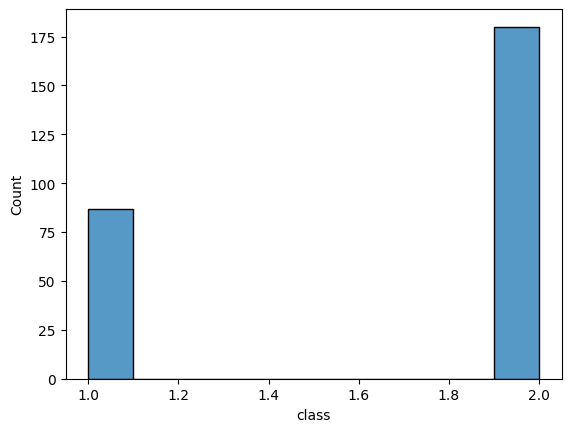

In [ ]:
import seaborn as sns
sns.histplot(data=df, x="class")

In [ ]:
X=df[['Region',	'Fresh',	'Milk',	'Grocery',	'Frozen',	'Detergents_Paper',	'Delicassen'	]].copy()
y=df[['class']].copy()

## K Nearest Neighbor (KNN)

### Introduction

K-Nearest Neighbors

* K-Nearest Neighbour is one of the simplest Machine Learning algorithms based on Supervised Learning technique.
* K-NN algorithm assumes the similarity between the new case/data and available cases and put the new case into the category that is most similar to the available categories.
* The KNN algorithm assumes that similar things exist in close proximity. In other words, similar things are near to each other.
* K-NN algorithm stores all the available data and classifies a new data point based on the similarity. This means when new data appears then it can be easily classified into a well suite category by using K- NN algorithm.
* K-NN algorithm can be used for Regression as well as for Classification but mostly it is used for the Classification problems.
* K-NN is a non-parametric algorithm, which means it does not make any assumption on underlying data.
* It is also called a lazy learner algorithm because it does not learn from the training set immediately instead it stores the dataset and at the time of classification, it performs an action on the dataset.
KNN algorithm at the training phase just stores the dataset and when it gets new data, then it classifies that data into a category that is much similar to the new data.




### Applications and usage

k-NN is often used in search applications where you are looking for “similar” items; that is, when your task is some form of “find items similar to this one”. You’d call this a k-NN search.


So, some concrete examples of k-NN search:

* If you’re searching for semantically similar documents (i.e., documents containing similar topics), this is referred to as Concept Search.

* The biggest use case of k-NN search might be Recommender Systems

* KNN can be effectively used in detecting outliers. One such example is Credit Card fraud detection.

* Missing data imputation is a procedure that uses the KNN algorithm to estimate missing values.

### Geometric intution

Lets understand KNN algorithm geometrically with a simple example:
-  Lets assume we have a few +ve class data and -ve class data points in our Training data

- Now in our test data we have a query point $x_q$

#### What will be the class label for $x_q$ ?
- From the plot, its  Most likely to be +ve class data point
- Since all the surrounding points are +ve

Now if we had a $x_q$ in the near the -ve class data points then
#### what will the class label for $x_q$ be ?
- -ve since the surrounding points are all -ve



**This shows that KNN is a neighborhood Algorithm, since it checks the neighborhood of $x_q$ and then assigns class label to the data point.**

#### But if now our $x_q$ is at point such that there are 3 -ve class data points and one +ve class data point, what will the class label for $x_q$ for such case be ?
- Now if we are considering 4 points around $x_q$ , we can say
    - $x_q$ belongs to -ve class since majority of neighbor points are -ve class labels

- but if we consider only 1 point around $x_q$, we can say
    - $x_q$ belongs to +ve class since the distance between the +ve class data point and $x_q$ is minimum

Hence this means that the number of points we consider as our neighborhood thus impacts the KNN.
- Therefore the K in the KNN means the number of  points we are to consider as our neighborhood.



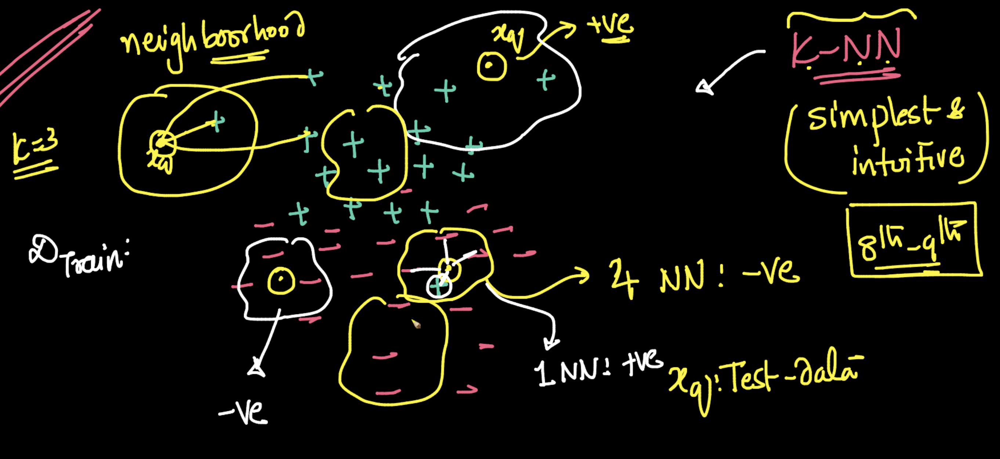

**ASSESSMENTS COVERED**

- https://www.scaler.com/hire/test/problem/16260/



- We already have training data with us, and we have a data point $x_q$ in test data,

Lets write the pseudo code for KNN algorithm

### The KNN Algorithm
1. for each $x_i$ in training data
    - Compute distance between $x_i$ and $x_q$
    - And store it in a distance vector $D$
2. Sort the distance vector $D$
3. Then pick the K Nearest Neighbors, or the points which have the least distance from $x_q$
4. Take majority vote of class label from all the K points and return the class label which has the max vote for $x_q$

In simple words,
- if we take K = 5, and after sorting the distance vector
- we get 3 +ve class label data points and 2 -ve Class label data  
- then through majority voting, $x_q$ will belong to +ve class.




    

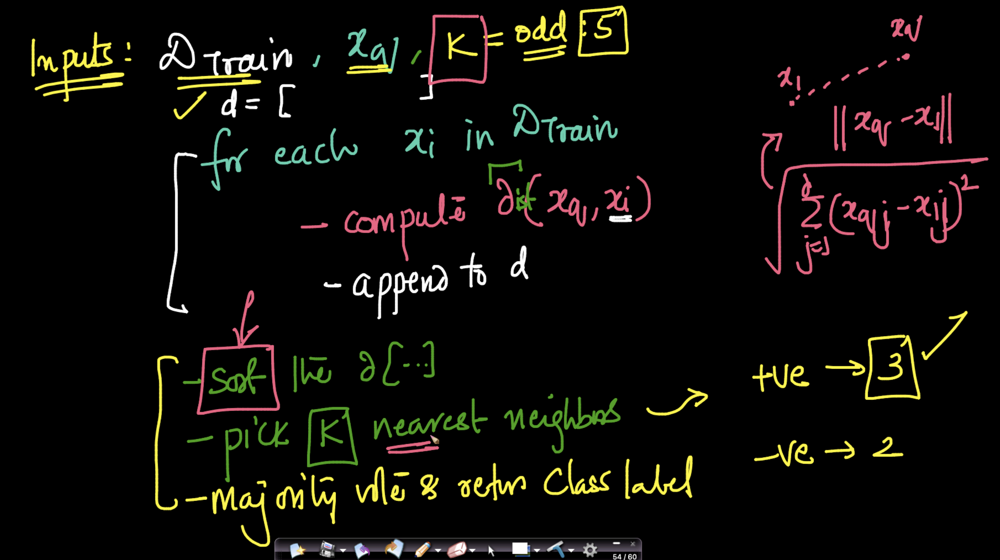

## Distance Metrics
####Q- How do we find the similar users? Which metric to choose?

A - That's again a hyper-parameter metric.

Various distances/similarity metrics can be used


- The most basic distance measure can be done using **Euclidean Distance**
- Which is the sum of the sqaure difference between each of the d-dimensional point of $x_1$ with $x_2$ and take a square root of it.
    - Euclidean $(x_1,x_2) = [ ∑_{j=1}^{j=d} {{ (x _{1j} - x _{2j} )}^2] }^{\frac{1}{2}} $


#### But what if value of d becomes too high ?
- Thats where Euclidean Distance fails to work due to something known as Curse of Dimensionality whose maths <font color='red'>we will cover in later lectures.<font>

<font color='red'>Instrcutor notes<font>
- We have already seen the Euclidean and Manhattan distance intuition in pre-read,
- Hence to be covered quickly

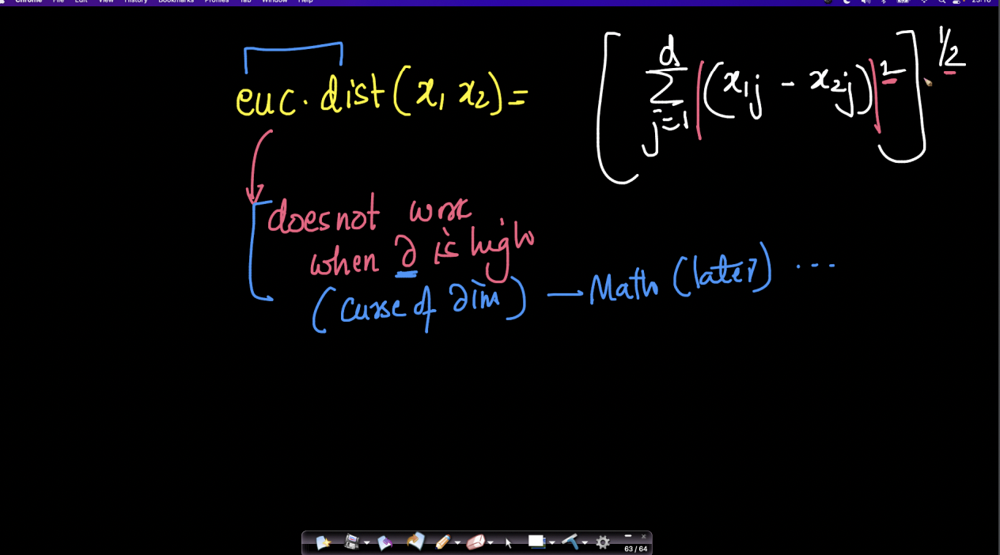

We now look into another distance measure metrics:  Manhattan Distance which is sum of all the absolute difference between each of the d-dimensional point of $x_1$ with $x_2$
- Manhattan $(x_1,x_2) = ∑_{j=1}^{j=d} {[{ | x _{1j} - x _{2j} |)}^1] }^{1} $

Now lets understand Manhattan, geometrically:

- We know between two feature points $x_1,x_2$, Euclidean distance will be the hypothesis of the right angle triangle

#### What will be the Manhattan Distance ?
- We are adding distance ($d_1$) along one axis (Here feature $f_1$ )
- and then the distance ($d_2$)along the other axis (Here feature $f_2$)
- Now summing up both $d_1$ and $d_2$ gives our Manhattan Distance

Lets understand it more with a grid like example:
- if we want to move from bottom-left point to top-right point,
- We can only move parallel to the axes (is that only up,down, left,right)
- And the closest path through which we can reach the goal point is our Manhattan Distance.

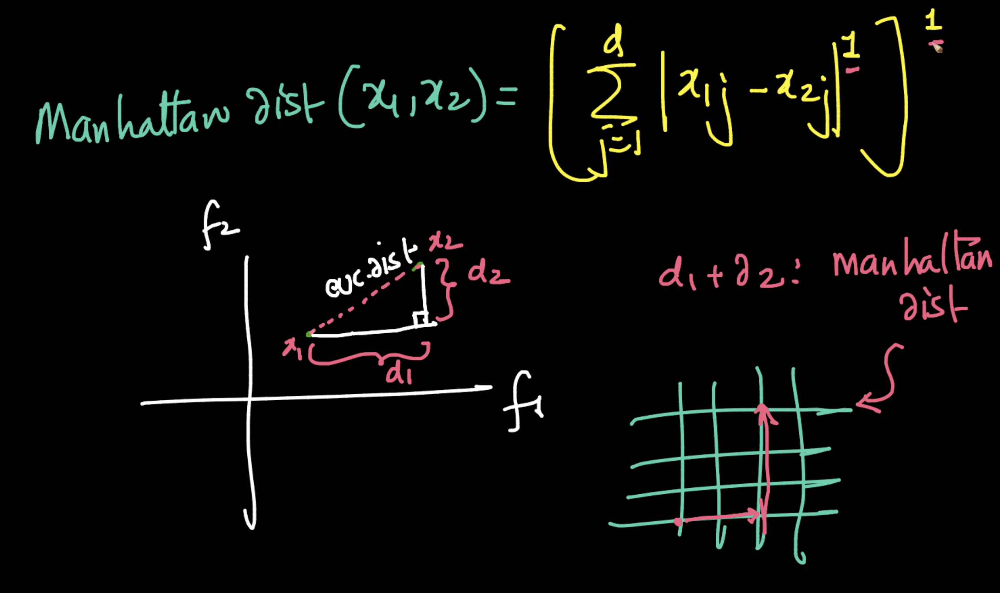

**ASSESSMENT COVERED**

Coding Question

- https://www.scaler.com/hire/test/problem/16082/
- https://www.scaler.com/hire/test/problem/24768/

- If we add Absolute to Euclidean Distance,
    - Since if we remember,$ |x|^2$ is same as $x^2$ because:
        - $(-x)^2 = (x)^2 = x^2$
        - and $|x| = ^{+}_{-}x$   
- we notice how Euclidean and Manhattan are very similar and the only difference is in the powers
    - Euc$(x_1,x_2) = ∑_{j=1}^{j=d} {[{ | x _{1j} - x _{2j} |}^2] }^{\frac{1}{2}} $

    - Man$(x_1,x_2) = ∑_{j=1}^{j=d} {[{ | x _{1j} - x _{2j} |}^1] }^{1} $



## Sklearn Implimentation of knn



**Note: We will cover PCA in detail after a few lectures, for now what we need to understand is that we are using this to reduce the dimension of the data so that it is easier for us to understand and visualise this in 2D. PCA is a technique to compress the data from a higher dimension to a lower dimension with minimal loss of information (how and why of this will come later)**

In [ ]:
from sklearn.decomposition import PCA
# reducing features to just 2 features
pca = PCA(n_components=2)
X = pca.fit_transform(X)
X.shape

(267, 2)

In [ ]:
df2 = pd.DataFrame(X, columns=['f1', 'f2'])
df2['y'] = y

df2.head()

,f1,f2,y
0,-1536.864538,-3890.155341,2
1,-6951.600822,-5398.876946,2
2,-6264.094692,-6680.220399,2
3,3951.287005,-9483.481680,1
4,8385.399752,-16.996995,1


In [ ]:
print(pca.explained_variance_ratio_)

[0.5058293 0.3499584]


<Axes: xlabel='f1', ylabel='f2'>

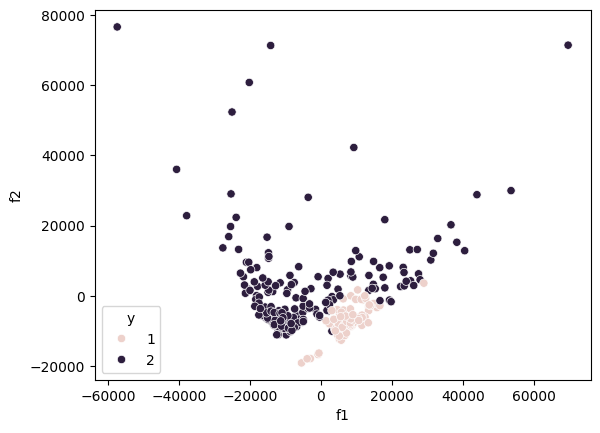

In [ ]:
sns.scatterplot(data= df2, x= 'f1',y = 'f2' , hue = 'y')

Here we can clearly see that the data is non-linearly seperable.

### KNN using Sklearn on PCA data

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

**Train, Validation, Test Split**
- Lets now splitting the data into train,Validation and test set by considering into these two features.

In [ ]:
X_tcv, X_test, y_tcv, y_test = train_test_split(df2[['f1', 'f2']].values, df2['y'].values,test_size=0.20, random_state=42)

X_train, X_val, y_train, y_val = train_test_split(X_tcv, y_tcv,test_size=0.20, random_state=42)

In [ ]:
print(f'Training data: {X_train.shape}, {y_train.shape}')
print(f'Validation data:{X_val.shape}, {y_val.shape}')
print(f'Test data:{X_test.shape}, {y_test.shape}')

Training data: (170, 2), (170,)
Validation data:(43, 2), (43,)
Test data:(54, 2), (54,)


In [ ]:
from sklearn.preprocessing import StandardScaler
st =  StandardScaler()

X_train_scaled = st.fit_transform(X_train)
X_val_scaled = st.transform(X_val)
X_test_scaled = st.transform(X_test)

y_train = y_train
y_val = y_val
y_test = y_test

In [ ]:
st =  StandardScaler()

X_train_scaled = st.fit_transform(X_train)
X_val_scaled = st.transform(X_val)
X_test_scaled = st.transform(X_test)

y_train = y_train
y_val = y_val
y_test = y_test

In [ ]:
knn = KNeighborsClassifier(metric='euclidean') #by defualt it uses 5 NN

knn.fit(X_train, y_train)

KNeighborsClassifier(metric='euclidean')

Accuracy of KNN on Test data

In [ ]:
y_pred = knn.predict(X_test)
knn.score(X_test, y_test)

0.9629629629629629

Precision, Recall, F1-Score of KNN on test data

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       1.00      0.85      0.92        13
           2       0.95      1.00      0.98        41

    accuracy                           0.96        54
   macro avg       0.98      0.92      0.95        54
weighted avg       0.96      0.96      0.96        54



Confusion Matrix of KNN on Test Data

In [ ]:
cm = confusion_matrix(y_test, y_pred)

cm_df = pd.DataFrame(cm,index = np.unique(y_test), columns = np.unique(y_test) )

cm_df.head()

,1,2
1,11,2
2,0,41


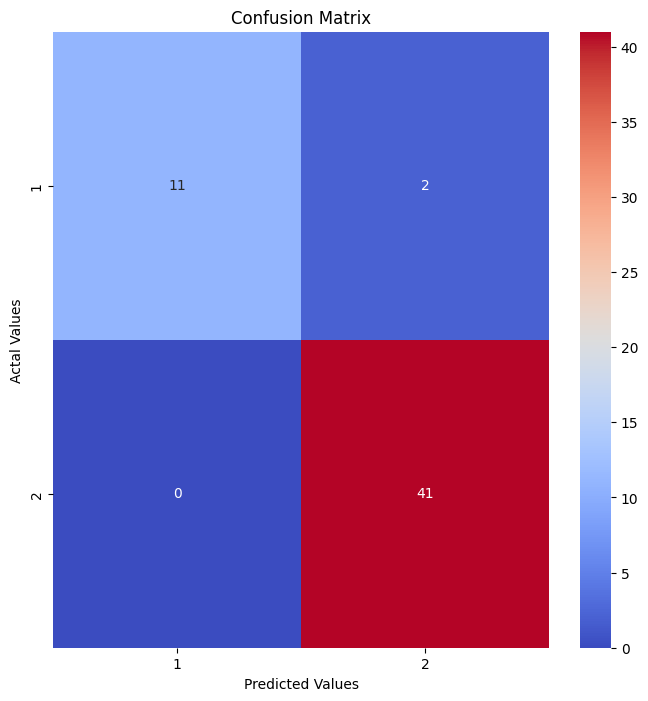

In [ ]:
#Plotting the confusion matrix
plt.figure(figsize=(8,8))
sns.heatmap(cm_df, annot=True,cmap='coolwarm')
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

### KNN using Sklearn on Original data

In [ ]:
X_new=df[['Region',	'Fresh',	'Milk',	'Grocery',	'Frozen',	'Detergents_Paper',	'Delicassen'	]].copy()
y_new=df[['class']].copy()

In [ ]:
X_train_val, X_test, y_train_val, y_test = train_test_split(X_new,y_new,test_size=0.25, random_state=42)

X_train, X_val, y_train, y_val = train_test_split(X_train_val,y_train_val,test_size=0.25, random_state=42)

In [ ]:
print(X_train.shape, y_train.shape)
print(X_val.shape, y_val.shape)
print(X_test.shape, y_test.shape)

(150, 7) (150, 1)
(50, 7) (50, 1)
(67, 7) (67, 1)


In [ ]:
from sklearn.preprocessing import StandardScaler

st =  StandardScaler()

X_train_scaled = st.fit_transform(X_train.values)
X_val_scaled = st.transform(X_val.values)
X_test_scaled = st.transform(X_test.values)

y_train = y_train.values[:,0]
y_val = y_val.values[:,0]
y_test = y_test.values[:,0]

In [ ]:
knn = KNeighborsClassifier(n_neighbors=5,metric='euclidean')

knn.fit(X_train_scaled, y_train)

KNeighborsClassifier(metric='euclidean')

In [ ]:
knn.score(X_val_scaled, y_val)

0.9

In [ ]:
from sklearn.metrics import classification_report

y_pred = knn.predict(X_val_scaled)
print(classification_report(y_val, y_pred))

              precision    recall  f1-score   support

           1       0.75      1.00      0.86        15
           2       1.00      0.86      0.92        35

    accuracy                           0.90        50
   macro avg       0.88      0.93      0.89        50
weighted avg       0.93      0.90      0.90        50



In [ ]:
from sklearn.metrics import confusion_matrix

y_pred = knn.predict(X_test_scaled)

cm = confusion_matrix(y_test, y_pred)

cm_df = pd.DataFrame(cm,index = np.unique(y_test), columns = np.unique(y_test) )

cm_df.head()

,1,2
1,13,2
2,6,46


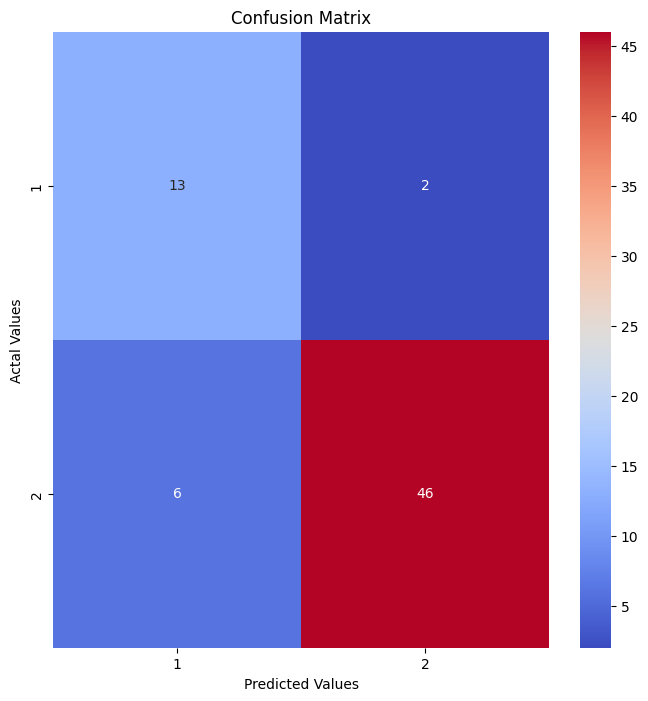

In [ ]:
#Plotting the confusion matrix
plt.figure(figsize=(8,8))
sns.heatmap(cm_df, annot=True,cmap='coolwarm')
plt.title('Confusion Matrix')
plt.ylabel('Actal Values')
plt.xlabel('Predicted Values')
plt.show()

**Assessment Covered**
- https://www.scaler.com/hire/test/problem/15899/

## Weighted KNN

#### Question: What if we take K as even number, such that we have 2 +ve class labels and 2 -ve class labels as top 4 neighbors?
- This can make the predictions wrongs, hence as a rule of thumb we tend on taking only odd values of K

Even with an Odd value of K:  

- If we have K = 5,
    - we have 2 -ve datapoints very close to  $x_q$
    - and 3 +ve datapoints far off of $x_q$.  

- According to Majority vote, $x_q$ will belong to class +ve
- even though, -ve class datapoints are close to the $x_q$

#### How can we avoid KNN model to not make such wrong predictions?
- By manupilating with value of K

#### But what if we can only take K = 5 ?
- till now, we have given same weightage to each K datapoints
- Now lets give weightage as inverse of Distance ($ {Weight} =  \frac{1}{distance} $)
- hence points closer to $x_q$ now have higher weights (=10) than weights(=2) for points further away
- Now if we take a weighted sum of all class labels:
    - -ve class labels will have weight = (10+10) =  20
    - +ve class labels will have weight = (2+2+2) = 8

- Now $x_q$ will be predicted as -ve class data point.

This way of using weights to find the class label for $x_q$ is what Weighted KNN is all about.




We simple allow it to be a part of any of the classes at random.

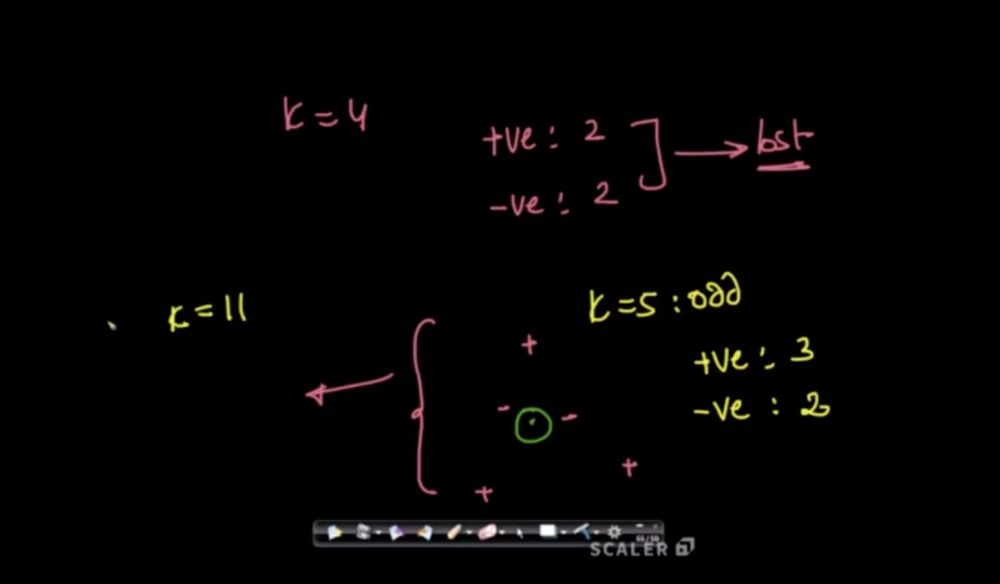

In [ ]:
w_knn = KNeighborsClassifier(n_neighbors=5,weights='distance',metric='euclidean')
w_knn.fit(X_train, y_train)

KNeighborsClassifier(metric='euclidean', weights='distance')

In [ ]:
y_pred = w_knn.predict(X_test)
w_knn.score(X_test, y_test)

0.9253731343283582

Precision, Recall, F1-Score of KNN on test data

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       0.78      0.93      0.85        15
           2       0.98      0.92      0.95        52

    accuracy                           0.93        67
   macro avg       0.88      0.93      0.90        67
weighted avg       0.93      0.93      0.93        67



**ASSESSMENTS COVERED**
- https://www.scaler.com/hire/test/problem/18036/

#### Question: What if we take K=5, and we have all the +ve and -ve class labels datapoints  equidistant from $x_q$, then how KNN predicts class label for $x_q$ ?
- KNN uses random choice here, where it can pick either of the +ve or -ve class label for $x_q$

- Or we can manupilate the value of K

- Though such cases are very rare to happen

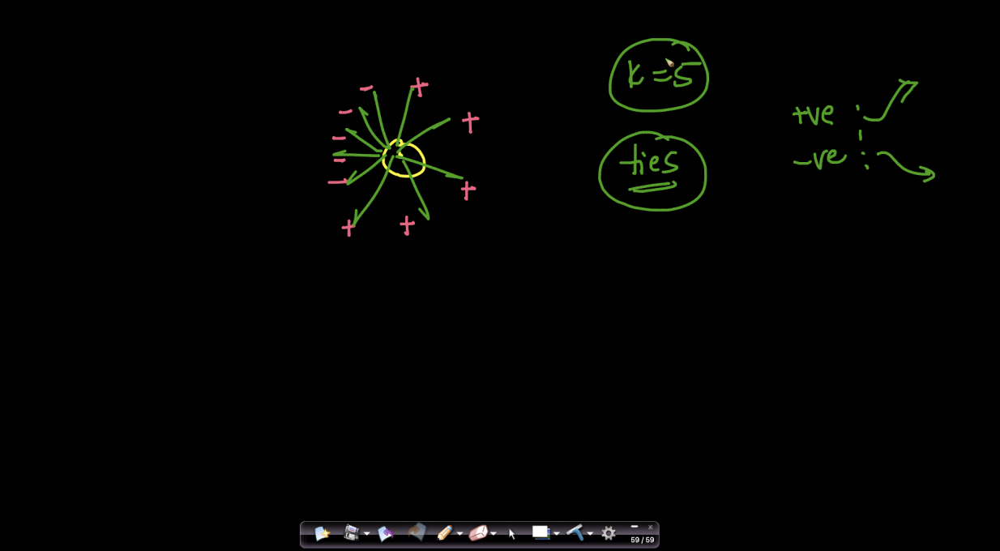

**ASSESSMENTS COVERED**
- https://www.scaler.com/hire/test/problem/15900/

- https://www.scaler.com/hire/test/problem/16457/


## Assumption of KNN:
- just like we saw how in Logistic Regression, an assumption a linearly separable hyperplane exists,

- Similarly, The KNN algorithm assumes that similar datapoints exists in close neighborhood.
- In other words, Neighborhoods are homogeneous is that, similar things are near to each other




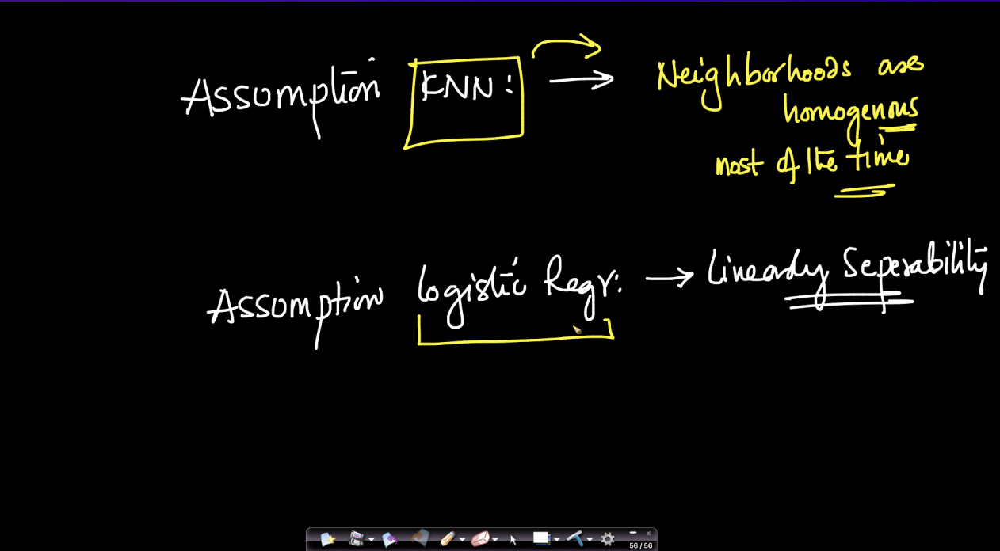

## Time-Complexity of KNN




#### Q. What will be the **train time** complexity for KNN?
- Ans. **O(1)**

But ,how?

- The only thing we are doing during is just spreading out all the points we have in train data.
- Basically we don't do anything during train time in KNN.



#### Q. What will be the **test time** complexity for KNN?
Ans. Let's break it into 2 steps:-
  - The first thing for new black data point in testing time is
    - Calculate distance of all points from the black point
    - If there are n points and each point is d-dimensinal,then for distance only we **O(n*d)** complexity.
  
  - The 2nd step is to sort the distances. This we do using Merge sort.
    - So Sorting complexity is O(nlogn)

  - Finally we will select k points, hence **O(nd + n*logn + k)**
  - We can ignore k , because this won't matter a lot.
  - So final complexity is **O(n[d*logn])**

  


  <center><img src="https://drive.google.com/uc?id=1Um0ypHQOeUJ8P2FO4enanIF6sNmCqNhV" width="900" height="800"> </center>

**QUIZ**

k-NN algorithm does more computation on test time rather than train time.

1. TRUE
2. FALSE


**Answer:**

1. True

**Explanation**

- The training phase of the algorithm consists only of storing the feature vectors and class labels of the training samples.

- In the testing phase, a test point is classified by assigning the label which are most frequent among the k training samples nearest to that query point – hence higher computation.

## Bias-Variance Trade Off in KNN


If we remember that, No training is involved in KNN,
#### how do we control the bias-Variance trade-off ?
- The only hyper-parameter tuning possible with KNN is K parameter.

Lets assume $K=1$, and we have two test data
1. One close to the +ve noise/outlier
2. Other close to the -ve noise/Outlier

#### What will be the class label for both the test data ?
- Clearly, it will be same as the class label of the outlier



This means, when the value of K is too low, KNN is fiting to the noise or getting impacted by the noise/ outliers, hence our KNN model is Overfitting


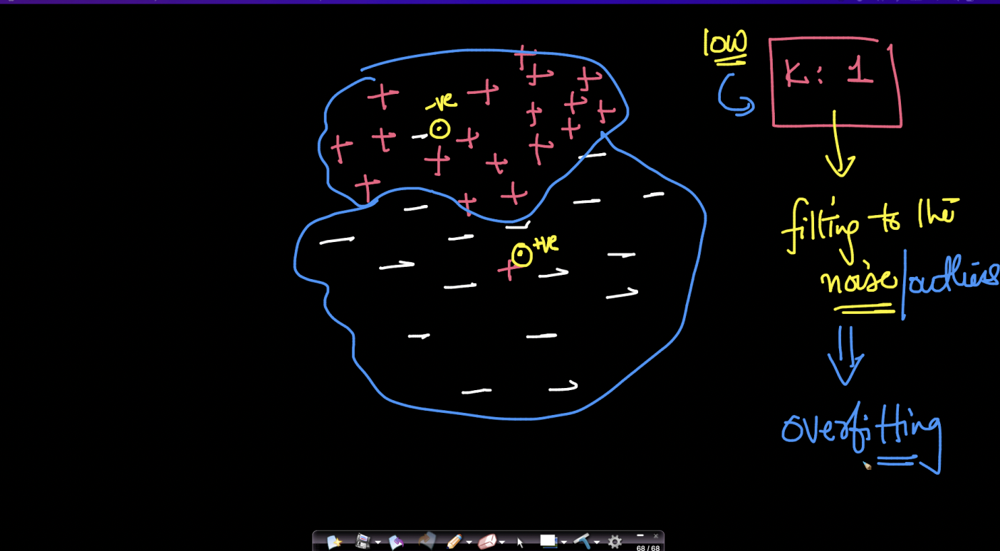


Now Lets consider K as a very large value, $K=101$, and training data
- has 61 datapoints as +ve label  - has 40 datapoints as -ve label

#### What will be the class label for any test datapoint ?
- No matter where the test datapoint is, the KNN model will always be predict the test datapoint as +ve class label.


This means, when the value of K is too high, KNN is Underfitting-


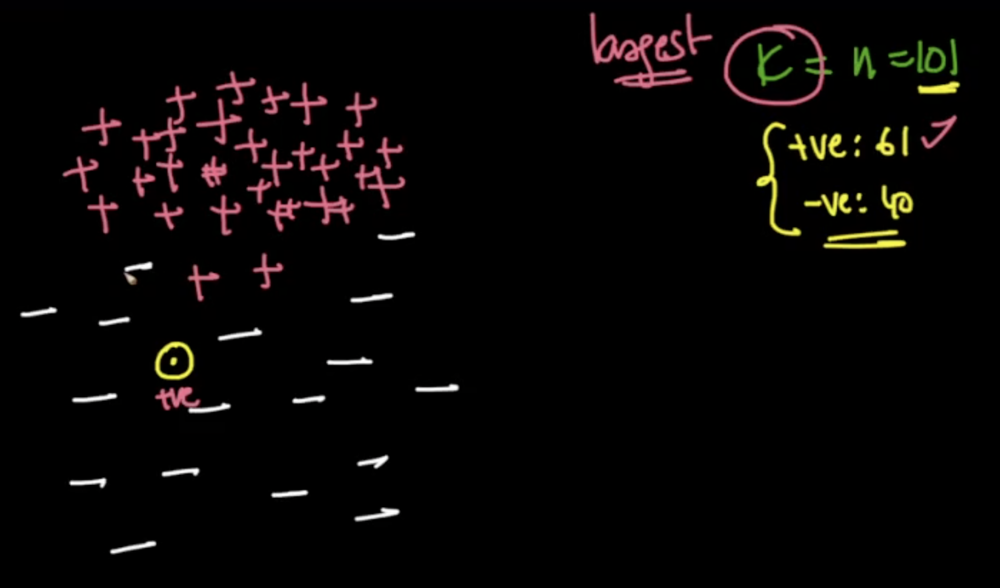

**QUIZ-2**

Which of the following will be true about k in k-NN in terms of Bias and Variance ?

1. When you increase the k the bias and variance will increase

2. When you increase the k the bias increases and variance decreases

3. When you increase the k the bias decreases and variance increases

4. When you increase the k the bias  and variance will decrease

**ANSWER**
- large K means underfit model which has high bias with less variance.


Now if plot error or any loss metrics and changing K Hyperparameter,
- We see how error is very high when KNN is overfitting and underfitting

- Hence, we pick that K ($K_{best}$) where errors is minimum


NOTE: we do all of this hyperparameter on our Validation data.



**QUIZ**

```
Which of the following will be true about k in k-NN in terms of Bias and Variance ?

1. When you increase the k the bias and variance will increase

2. When you increase the k the bias increases and variance decreases

3. When you increase the k the bias decreases and variance increases

4. When you increase the k the bias  and variance will decrease
```

**ANSWER**
- large K means underfit model which has high bias with less variance.


**ASSESSMENTS COVERED**
- https://www.scaler.com/hire/test/problem/30105/
- https://www.scaler.com/hire/test/problem/15898/

- https://www.scaler.com/hire/test/problem/16456/

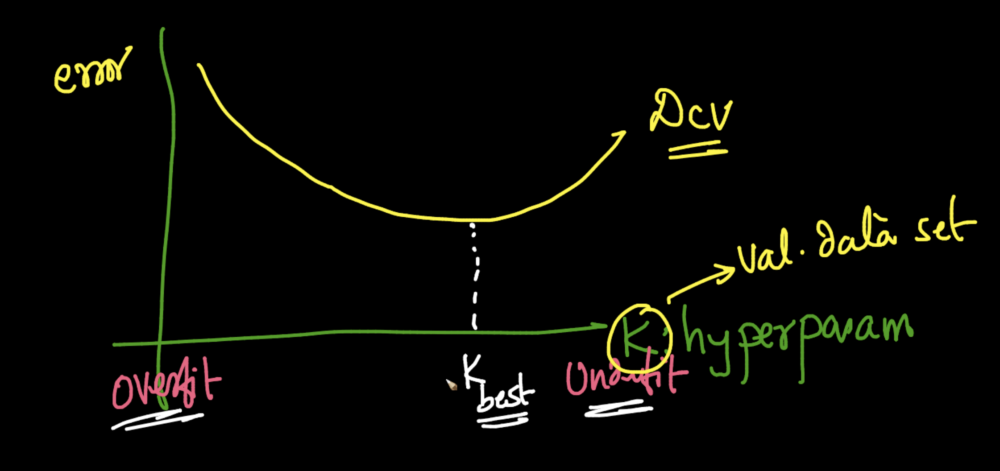

**QUIZ**

Which of the following option is true about k-NN algorithm?

1. It can be used for classification
2. It can be used for regression
3. It can be used in both classification and regression

**ANSWER**:
3. It can be used in both classification and regression

**EXPLANATION**
We can also use k-NN for regression problems. In this case the prediction can be based on the mean or the median of the k-most similar instances.

**ASSESSMENTS COVERED**
- https://www.scaler.com/hire/test/problem/16455/



- https://www.scaler.com/hire/test/problem/15860/ (hold)



CODING QUESTION:
- https://www.scaler.com/hire/test/problem/25269/

**QUIZ**

```
KNN gets 100% accuracy on training data. But when the model was deployed on client side, the model performed poorly. Which of the following thing might gone wrong?

1. Very small value of K is used
2. Very large value of K is used
3. Can't Say
4. None of these

```
**ANSWER**

1. Very small value of K is used

## Multi-Class Classification using KNN

#### How do you think KNN would work if there more than two classes?

- It would work the same way as before. Depending on the k value, it will look k nearest neighbour and classify accordingly.

  <center><img src="https://drive.google.com/uc?id=1PA9EnV-4ydiIRURfxmWiiSomyXD8q4R9" width="800" height="400"> </center>

#### Given k=5 and 3 classes what if two classes have equal majority ?

- If this the case try to change the value of k.

  <center><img src="https://drive.google.com/uc?id=1lA0bFJx3yu3YGh9gTZPO4TkuaYTR8wPn" width="600" height="400"> </center>

## Outliers
Lets consider some data points which have 3 outliers,
- Out of which two are -ve class labels and one is +ve class label

Do outliers impact the kNN model if we take K = 3?
- for the two -ve class outliers, the $x_q$ will get impacted and have a -ve class label , instead of +ve class label

- While for the +ve class outlier, the $x_q$ is predicted correctly

What if we reduce K to K=1 will outliers effect KNN?
- Both the outliers effect the KNN

What if we increase K to K=7 will outliers effect KNN?
- No, the outliers wont have any impact since the neighborhood will have majority of correct labels






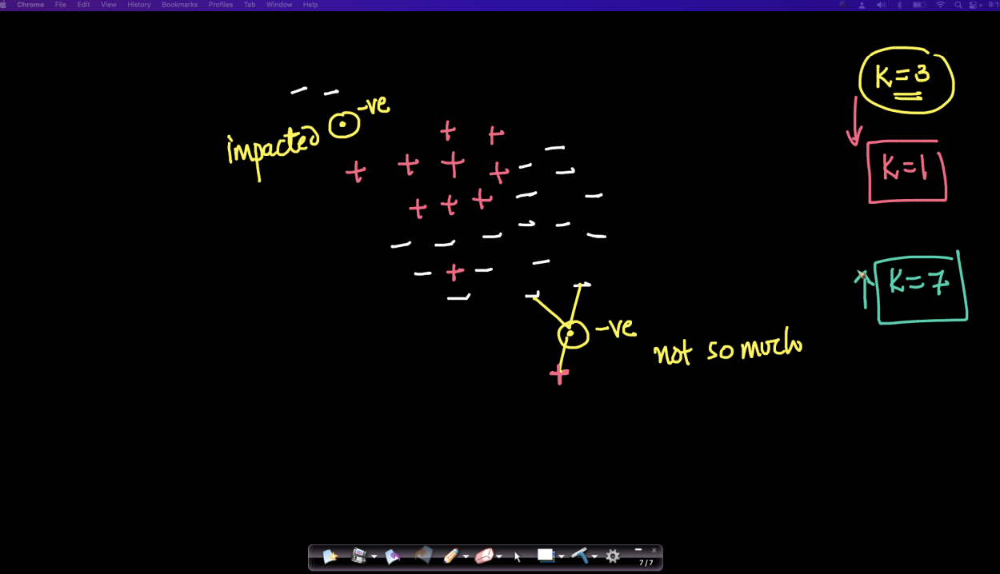

## KNN based Imputation

### Missing Value Patterns
The absence of values is a cause of concern for real-life datasets. When collecting observations about a variable, missing values can occur due to reasons as diverse as –

* an error in machinery/equipment
* error on part of the researcher
* unavailable respondents
* accidental deletion of observations
* forgetfulness on part of the respondents
* error in accounting, etc.


### KNN imputation
Lets say we have a d-dimensionsal features with n samples.
- Now for the $x_i$ feature,
    - the $j^{th}$ dimension is missing  


We have seen in EDA, hown imputation is used to fill the missing values


#### Can we use KNN for Imputating missing data ?
1. to find the value of $x_{ij}$, we find the K Nearest neighbors  for the $x_{i}$ but excluding all the dimensions which have missing value.
    - Hence we remove the jth dimension and compute the nearest neighbors

2. Supposedly, after performing KNN(with K = 5) we get $x_{10}, x_{12}, x_{14}, x_{31}, x_{42}$ as nearest neighbors
    - we then take the average of the $j^{th}$  values of each of the nearest neighbors and use it to impute the missing value for $x_i$




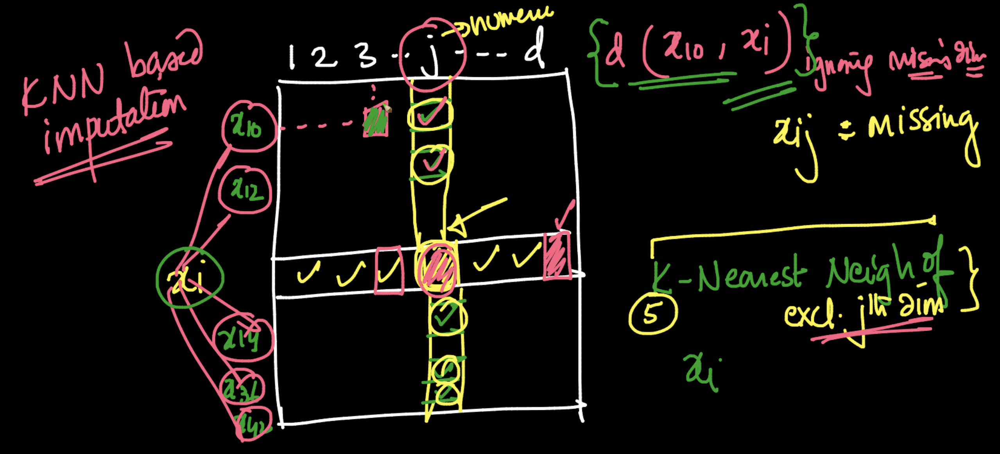

In [ ]:
!gdown 1vDIXh1yJxLpmgdh3gZGM6WX0u3GCPuIS
#https://drive.google.com/file/d/1vDIXh1yJxLpmgdh3gZGM6WX0u3GCPuIS/view?usp=sharing

Downloading...
From: https://drive.google.com/uc?id=1vDIXh1yJxLpmgdh3gZGM6WX0u3GCPuIS
To: /content/knn_imputation.csv
100% 12.9k/12.9k [00:00<00:00, 27.7MB/s]


In [ ]:
import pandas as pd
import numpy as np

df_imp = pd.read_csv('knn_imputation.csv')
df_imp.drop(['Unnamed: 0'],axis=1,inplace=True)

In [ ]:
df_imp.head()

,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,3.0,12669.0,9656.0,7561.0,214.0,2674.0,1338.0
1,3.0,7057.0,9810.0,9568.0,1762.0,3293.0,1776.0
2,3.0,6353.0,8808.0,NaN,2405.0,3516.0,7844.0
3,3.0,13265.0,1196.0,4221.0,6404.0,507.0,1788.0
4,3.0,22615.0,5410.0,7198.0,3915.0,1777.0,5185.0


In [ ]:
df_imp.isna().sum()

,0
Region,8
Fresh,13
Milk,15
Grocery,9
Frozen,8
Detergents_Paper,10
Delicassen,11


**observe**

We have ```nan``` values for every feature

Lets see if kNN can impute these missing values

In [ ]:
from sklearn.impute import KNNImputer
from sklearn.preprocessing import MinMaxScaler

KNN Imptuer is a distance-based imputation method and it requires us to normalize our data. Otherwise, the different scales of our data will lead the KNN Imputer to generate biased replacements for the missing values. For simplicity, we will use Scikit-Learn’s MinMaxScaler which will scale our variables to have values between 0 and 1.

In [ ]:
scaler = MinMaxScaler()
df_imp = pd.DataFrame(scaler.fit_transform(df_imp), columns = df_imp.columns)
df_imp.head()

,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,1.0,0.112821,0.129791,0.081464,0.003106,0.065427,0.027847
1,1.0,0.062774,0.131890,0.103097,0.028548,0.080590,0.036984
2,1.0,0.056495,0.118232,NaN,0.039116,0.086052,0.163559
3,1.0,0.118136,0.014476,0.045464,0.104842,0.012346,0.037234
4,1.0,0.201520,0.071915,0.077552,0.063934,0.043455,0.108093


In [ ]:
df_imp.describe().T

,count,mean,std,min,25%,50%,75%,max
Region,259.0,0.795367,0.369131,0.0,0.500000,1.000000,1.000000,1.0
Fresh,254.0,0.143317,0.130919,0.0,0.041007,0.127875,0.195475,1.0
Milk,252.0,0.107093,0.121421,0.0,0.030880,0.077804,0.133945,1.0
Grocery,258.0,0.119854,0.120562,0.0,0.035898,0.095859,0.157466,1.0
Frozen,259.0,0.054844,0.093456,0.0,0.012729,0.027382,0.062315,1.0
Detergents_Paper,257.0,0.103844,0.141083,0.0,0.010019,0.056952,0.152680,1.0
Delicassen,256.0,0.040807,0.074037,0.0,0.011885,0.026637,0.048775,1.0


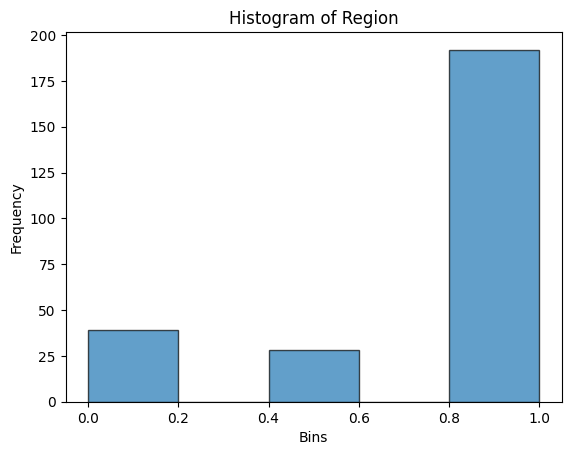

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

plt.hist(df_imp['Region'], bins=5, edgecolor='black', alpha=0.7)
plt.title('Histogram of Region')
plt.xlabel('Bins')
plt.ylabel('Frequency')
plt.show()

In [ ]:
imputer = KNNImputer(n_neighbors=5)
df_imp = pd.DataFrame(imputer.fit_transform(df_imp),columns = df_imp.columns)

In [ ]:
df_imp.isna().sum()

,0
Region,0
Fresh,0
Milk,0
Grocery,0
Frozen,0
Detergents_Paper,0
Delicassen,0


In [ ]:
df_imp.describe().T

,count,mean,std,min,25%,50%,75%,max
Region,267.0,0.795880,0.364421,0.0,0.500000,1.000000,1.000000,1.0
Fresh,267.0,0.141541,0.128379,0.0,0.043489,0.125583,0.189302,1.0
Milk,267.0,0.105551,0.118506,0.0,0.033395,0.080287,0.131338,1.0
Grocery,267.0,0.119380,0.119132,0.0,0.035090,0.097546,0.159150,1.0
Frozen,267.0,0.054288,0.092178,0.0,0.012976,0.027825,0.060852,1.0
Detergents_Paper,267.0,0.103088,0.139469,0.0,0.010227,0.055262,0.154370,1.0
Delicassen,267.0,0.040507,0.072587,0.0,0.012244,0.026679,0.047851,1.0


In [ ]:
df_imp.head()

,Region,Fresh,Milk,Grocery,Frozen,Detergents_Paper,Delicassen
0,1.0,0.112821,0.129791,0.081464,0.003106,0.065427,0.027847
1,1.0,0.062774,0.131890,0.103097,0.028548,0.080590,0.036984
2,1.0,0.056495,0.118232,0.114492,0.039116,0.086052,0.163559
3,1.0,0.118136,0.014476,0.045464,0.104842,0.012346,0.037234
4,1.0,0.201520,0.071915,0.077552,0.063934,0.043455,0.108093


### Validity check of imputation




if you observe carefully the mean of each features before and after imputation is same.

**Why Should the Means be the Same Before and After Imputation?**
- The mean is a measure of central tendency that provides information about the average value of a feature in the dataset.
- If the mean of a feature changes significantly after imputation, it suggests that the imputation process has introduced a systematic bias or has shifted the distribution of that feature.
- The idea behind KNN imputation is to fill in missing values based on the similarity of data points.
- If the imputation process is effective, the imputed values should resemble the original values closely, and the means should be similar.
- A significant difference in means could indicate that the imputed values are not representative of the overall distribution of the data, and further investigation or adjustment of the imputation method may be needed.

Another way is to compare the histogram of a feature before and after imputation which ensure that the imputation process maintains the overall distribution and characteristics of the original data. Consistency in the histogram indicates that imputed values align with the existing data distribution, preventing the introduction of biases or significant alterations to the feature's pattern.

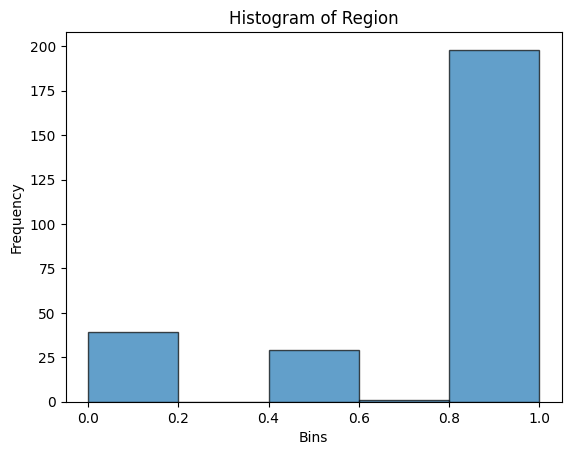

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

plt.hist(df_imp['Region'], bins=5, edgecolor='black', alpha=0.7)
plt.title('Histogram of Region')
plt.xlabel('Bins')
plt.ylabel('Frequency')
plt.show()

**ASSESSMENT COVERED**
- https://www.scaler.com/hire/test/problem/20527/

### How to impute Categorical data using KNN?

For imputing missing values in categorical variables, we have to encode the categorical values into numeric values as kNNImputer works only for numeric variables. We can perform this using a mapping of categories to numeric variables.

In [ ]:
data=[
    ["Anthony", "29","Male"],
    ["Juli", "25","Female"],
    ["Tommy", "30","Male"],
    ["Niki", "23","Female"],
    ["Aditi", "24",None]
]

df=pd.DataFrame(data,columns=["name","age","gender"])
df.head()

,name,age,gender
0,Anthony,29,Male
1,Juli,25,Female
2,Tommy,30,Male
3,Niki,23,Female
4,Aditi,24,None


In [ ]:
df["gender_map"]=df.gender.map({"Male":0,"Female":1})
df.head()

,name,age,gender,gender_map
0,Anthony,29,Male,0.0
1,Juli,25,Female,1.0
2,Tommy,30,Male,0.0
3,Niki,23,Female,1.0
4,Aditi,24,None,NaN


In [ ]:
imputer = KNNImputer(n_neighbors=2)
df = pd.DataFrame(imputer.fit_transform(df[["age","gender_map"]]),columns=["age","gender_mapping"])

In [ ]:
df

,age,gender_mapping
0,29.0,0.0
1,25.0,1.0
2,30.0,0.0
3,23.0,1.0
4,24.0,1.0


We can also perform One hot encoding of categorical features

### What is Imbalance data ?

<center><img src="https://drive.google.com/uc?id=1X5GoL-ZNymzKo_Alhx1S_vDeKiytY3V6" width="700" height="400"> </center>

Ans. When the number of samples for particular class is more than the number of samples of the other classes.

1. if there is a 70-30% Class sample ratio → **slightly imbalanced**

2. if there is a 80-20%/90-10% Class sample ratio → **imbalanced**

3. if there is a 95-5% Class sample ratio → **extremely imbalanced**



**Note:**
- The class which has **more number of samples → Majority Class**
- The class which has **less number of samples → Minority Class**

<img src=https://d2beiqkhq929f0.cloudfront.net/public_assets/assets/000/042/253/original/Screenshot_2023-08-08_at_11.41.27_AM.png?1691477017 width=700>

**Quiz**

```
Which among the following is a balanced data ?

a) 50 -ve samples, 50 +ve samples
b) 100 -ve samples, 10 +ve samples
c) 10 -ve samples, 100 +ve samples
d) 2 -ve samples, 98 +ve samples
```

**Correct Answer**
a) 50 -ve samples, 50 +ve samples


**Quiz**

```
For our Spam Classifier problem, which is majority class ?

a) Spam
b) Non-Spam
```
**correct Answer**
b) Non-Spam

### Business case Churn Prediction
Lets understand this with a Business Case study of Churn Prediction which we already covered in Logistic Regression.

Note: In the Logistic Regression lecture, the Churn Data we used was processed such that we removed the Imbalance present in the data

Recapping the Problem Statement:
- The dataset is in telecom domain, that contains some Customer features such as {last month bill, usage , Account Length}
- and we want to predict if the customer will churn or not

#### what does churn mean?
- Lets take an example,
- supposedly we are a customer of Airtel
- and for some reason we have switched to another telecom company,
- Then we have churned as a customer

#### Why even predict customer churn or not ?
- The Telecom company, after predicting those customers who will churn
- can reach out to them and provide offers such that they do not churn

#### Question: If we think of the dataset, how many Churn data samples will be there in the data ?
- Only a handful, hence the Churn data samples <<< the data samples of not Non Churn,
- hence making the data imbalanced.

Now lets load the dataset:

In [ ]:
import pandas as pd
import numpy as np
from numpy import argmax

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score , f1_score, ConfusionMatrixDisplay,classification_report

In [ ]:
## Run the below line to install a lower version if gdown throws any error
#!pip install gdown==4.6.0

#OR

#!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=1rQPzACKn3SANJwBuJe_Wzk-B0sEGDRrW' -O Churn.csv

In [ ]:
!gdown 1rQPzACKn3SANJwBuJe_Wzk-B0sEGDRrW

Downloading...
From: https://drive.google.com/uc?id=1rQPzACKn3SANJwBuJe_Wzk-B0sEGDRrW
To: /content/Churn.csv
100% 289k/289k [00:00<00:00, 25.3MB/s]


In [ ]:
churn = pd.read_csv("Churn.csv")
churn.head()

,Account Length,VMail Message,Day Mins,Eve Mins,Night Mins,Intl Mins,CustServ Calls,Churn,Intl Plan,VMail Plan,...,Day Charge,Eve Calls,Eve Charge,Night Calls,Night Charge,Intl Calls,Intl Charge,State,Area Code,Phone
0,128,25,265.1,197.4,244.7,10.0,1,0,0,1,...,45.07,99,16.78,91,11.01,3,2.70,KS,415,382-4657
1,107,26,161.6,195.5,254.4,13.7,1,0,0,1,...,27.47,103,16.62,103,11.45,3,3.70,OH,415,371-7191
2,137,0,243.4,121.2,162.6,12.2,0,0,0,0,...,41.38,110,10.30,104,7.32,5,3.29,NJ,415,358-1921
3,84,0,299.4,61.9,196.9,6.6,2,0,1,0,...,50.90,88,5.26,89,8.86,7,1.78,OH,408,375-9999
4,75,0,166.7,148.3,186.9,10.1,3,0,1,0,...,28.34,122,12.61,121,8.41,3,2.73,OK,415,330-6626


In [ ]:
churn.shape

(3333, 21)

Lets also check if there are any duplicates in the dataset

In [ ]:
if churn.shape[0] == churn.drop_duplicates().shape[0] :
    print('No duplicates Found')
else:
    duplicates = churn.shape[0] - churn.drop_duplicates().shape[0]
    print('{} duplicates found'.format(duplicates))

No duplicates Found


Checking for NULL values

In [ ]:
churn.isna().sum()

,0
Account Length,0
VMail Message,0
Day Mins,0
Eve Mins,0
Night Mins,0
Intl Mins,0
CustServ Calls,0
Churn,0
Intl Plan,0
VMail Plan,0


- Notice how there is no null values in the dataset

Recall how we used only a few features from the dataset which might not be the best ones to choose.

- Considering the same

In [ ]:
cols = ['Day Mins', 'Eve Mins', 'CustServ Calls', 'Intl Plan','VMail Message']
y = churn["Churn"]
X = churn[cols]
X.shape

(3333, 5)

Lets do a Count of samples for each Class labels

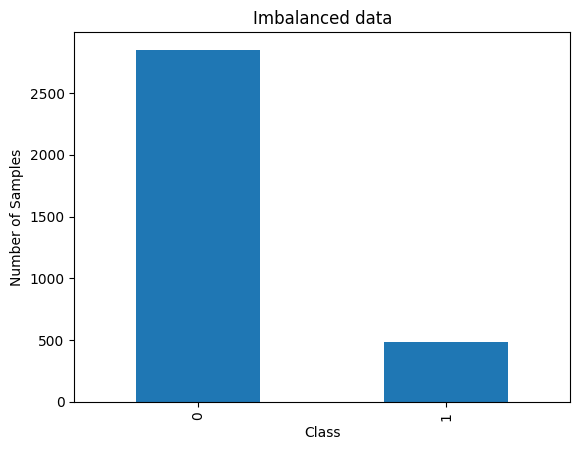

In [ ]:
churn["Churn"].value_counts().plot(kind='bar')
plt.xlabel('Class')
plt.ylabel('Number of Samples')
plt.title('Imbalanced data')
plt.show()

- Notice how we have a few samples of Churn Data samples, and more samples of Not Churn Data samples


Spliting data in Train, Validation and test set

In [ ]:
# Train, CV, test split
from sklearn.model_selection import train_test_split
#0.6, 0.2, 0.2 split

X_tr_cv, X_test, y_tr_cv, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X_train, X_val, y_train, y_val = train_test_split(X_tr_cv, y_tr_cv, test_size=0.25, random_state=42) # 0.25 x 0.8 = 0.2

In [ ]:
X_train.head()

,Day Mins,Eve Mins,CustServ Calls,Intl Plan,VMail Message
1399,167.6,219.2,4,0,0
360,257.1,312.2,1,1,0
1136,270.3,215.2,1,1,26
2078,131.1,176.2,1,0,0
2011,194.2,193.8,3,0,0


In [ ]:
print(f'Training data: {X_train.shape}, {y_train.shape}')
print(f'Validation data:{X_val.shape}, {y_val.shape}')
print(f'Test data:{X_test.shape}, {y_test.shape}')

Training data: (1999, 5), (1999,)
Validation data:(667, 5), (667,)
Test data:(667, 5), (667,)


### Imbalance data with kNN



- We have seen how outliers can affect the KNN model.


# **Can KNN get affected by Imbalanced data ?**

Lets take an example:
- Supposedly we have a lot of +ve class labels datapoints as compared to -ve class labels data points
- We know, The value of K ranges from 1 to number of total datapoints in the data (n)

#### Now if k = 7, what will KNN model predict for $x_q$ ?
- We see irrespective of where the $x_q$ will be, KNN will always predict $x_q$ as a +ve class label
- Since the majority of K nearest neighbors will be +ve class labels











<center><img src="https://drive.google.com/uc?id=16DCMrxd3jsY1u_f_ump_ykXBFO3lmy3P" width="900" height="400"> </center>

this shows that,
**when value of K is very large or close to number of datapoints(n)**,
- Data imbalance effects KNN model predictions

## **What if K<<n, will imbalance data impact KNN model predictions ?**

Lets take an example
- We again take a dataset where datapoints of +ve labels more than datapoints of -ve labels but we set K = 3,
- now when we predict for $x_q$ (highlighted in pink dot), we see how the KNN will be predicting the class label as -ve
- even though we have a lot of +ve class label datapoints

hence when k << n , then imbalance impacts KNN much less






<center><img src="https://drive.google.com/uc?id=1VDwjNHUs20HwV2mQ-fyUf_6agWUJ5SYQ" width="900" height="400"> </center>

#### Lets check how KNN on our imbalanced Churn prediction Dataset

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

Calculating  $K_{best}$
- with k values ranging: $1 \le k \le 50$

Note: Error defined as 1-accuracy

In [ ]:
from sklearn.preprocessing import StandardScaler

st =  StandardScaler()

X_train_scaled = st.fit_transform(X_train)
X_val_scaled = st.transform(X_val)
X_test_scaled = st.transform(X_test)

In [ ]:
error = []

# Calculating error for K values between 1 and 50
# Note: 51 is not included in the loop
for i in range(1, 51):
    knn = KNeighborsClassifier(n_neighbors=i,metric='euclidean')
    knn.fit(X_train_scaled, y_train)
    pred_i = knn.predict(X_val_scaled)
    error.append(np.mean(pred_i != y_val))

In [ ]:
len(error)

50

Visualizing the error and K values

Text(0, 0.5, 'Mean Error')

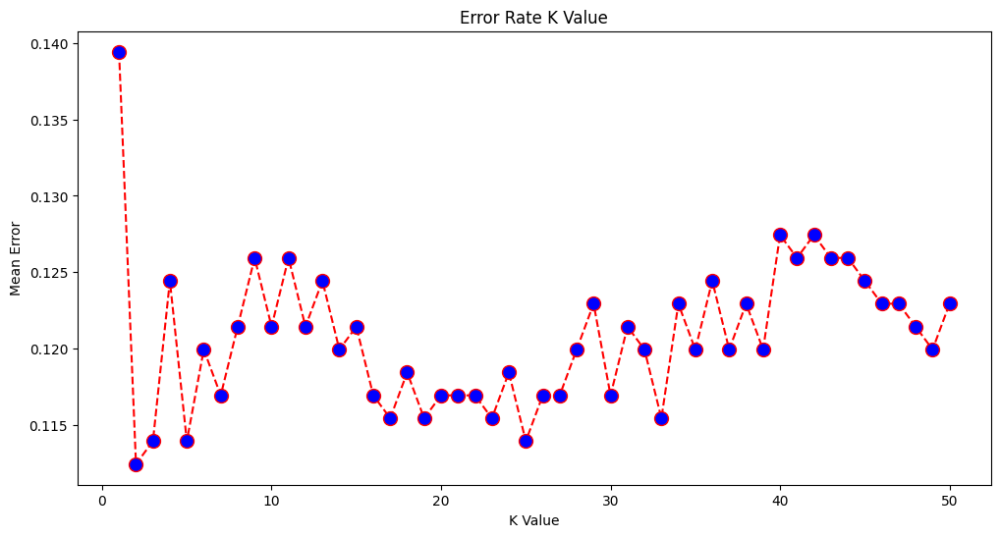

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(range(1, 51), error, color='red', linestyle='dashed', marker='o',
         markerfacecolor='blue', markersize=10)
plt.title('Error Rate K Value')
plt.xlabel('K Value')
plt.ylabel('Mean Error')

- Noticing that the first K value where Mean error is lowest is at K = 2,
- Hence $K_{best} = 2$

Note: The finding of $K_{best}$ was done on Validation Data

In [ ]:
knn = KNeighborsClassifier(n_neighbors=2,metric='euclidean')

knn.fit(X_train_scaled, y_train)

KNeighborsClassifier(metric='euclidean', n_neighbors=2)

Accuracy of KNN on Test data

In [ ]:
y_pred = knn.predict(X_test_scaled)
knn.score(X_test_scaled, y_test)

0.8830584707646177

#### Question: Will Accuracy be the best metric to measure model performance in Imbalance Dataset ?

Recall from Classification Metrics, when we have imbalance data
- We do not use Accuracy as peformance metric

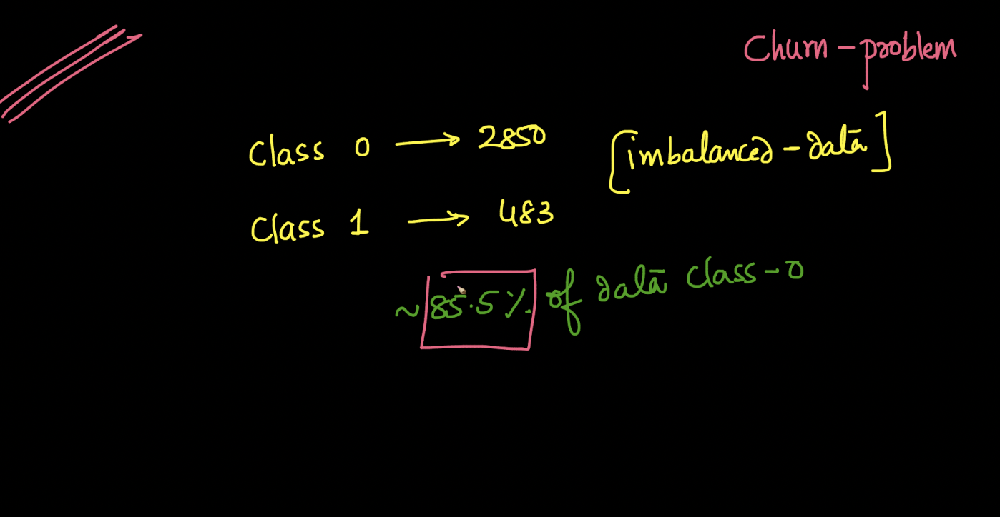

#### if 85.5% of the data is $y_i = 0$, so a model which predicts $y =0$ for all the 100% of data what will be its Accuracy ?
- Since the model will hit the correct predictions 85.5% of the time, the Accuracy will be 85.5%
- Even though the model is terrible


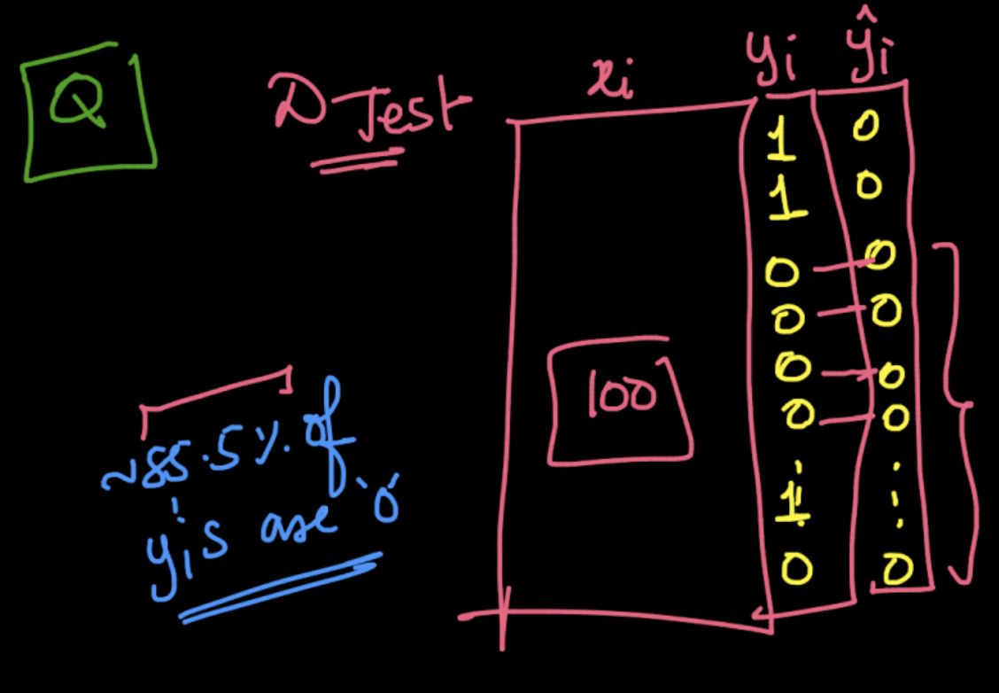


Hence using Confusion matrix, Precision, Recall, F1-Score on test data

**QUIZ**

```
which of the following should be prefered for Imbalance data when we want to give equal importance to all TP, FP, FN, TN ?

1. F1-Score
2. Accuracy
3. Precision
4. Recall

```
**Answer**

1. F1-Score

Confusion Matrix of KNN on Test Data

In [ ]:
cm = confusion_matrix(y_test, y_pred)

cm_df = pd.DataFrame(cm,index = np.unique(y_test), columns = np.unique(y_test) )

cm_df.head()

,0,1
0,554,12
1,66,35


Text(0.5, 1.0, 'Confusion Matrix')

<Figure size 800x800 with 0 Axes>

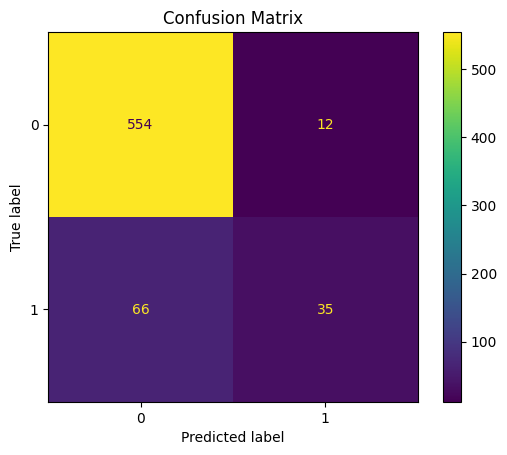

In [ ]:
#Plotting the confusion matrix
plt.figure(figsize=(8,8))
ConfusionMatrixDisplay(cm).plot()
plt.title('Confusion Matrix')

Using F1-Score as metric

In [ ]:
f1_score(y_test,y_pred)

0.47297297297297297

Note : We can see KNN is impacted by Imbalance in Churn Dataset but not to a large extent

# **Imbalance Data with Logistic Regression**

https://www.scaler.com/meetings/i/dsml-advanced-logistic-regression-2-2/archive Timestep:Timestep:[2:05:23- 2:28:00]


For Churn Prediction lets say,

- in our training data, we have 850 non churn (0) samples and 150 churn (1) samples.

- Now if there is a hyperplane Π that separates the dataset,

- Recall, how in logistic regression, we minimize the loss function which was the summation of log-loss over the entire data sample (n).
 - Loss = $∑_{i=1}^{i=n} logloss_i$

#### But since -ve class samples much greater than +ve class samples, What will be the effect on the loss function?
- The -ve class sampled data dominates the loss functions
- This makes the hyperplane Π to be pushed away from the -ve class data points
- Since the -ve class labels will want to be as further away from the hyperplane as possible.
- thus the model favors -ve class label points and ignores the +ve class label

Notice, how Imbalance data also effects Logistic Regression model,

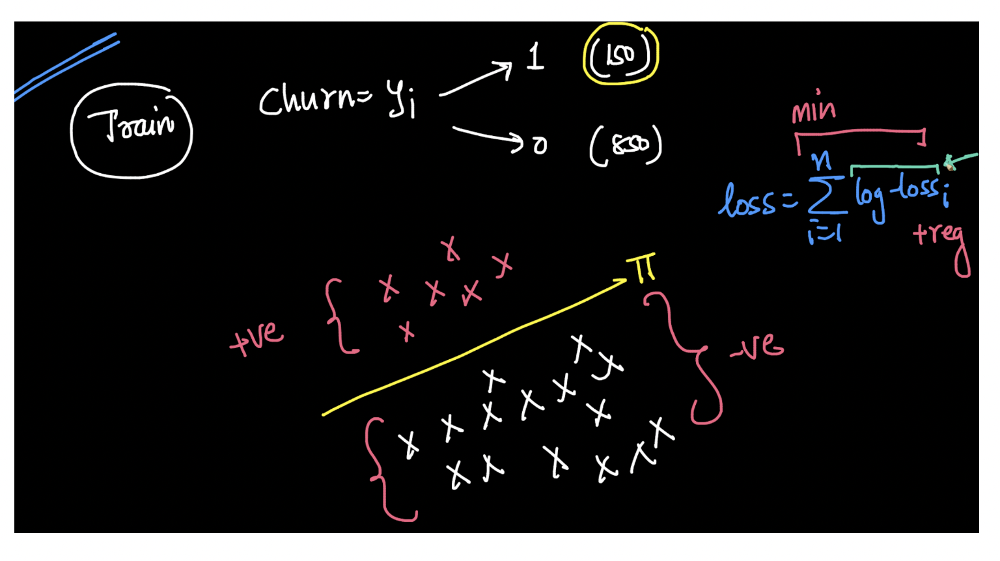

# **Handling Imbalance Data**


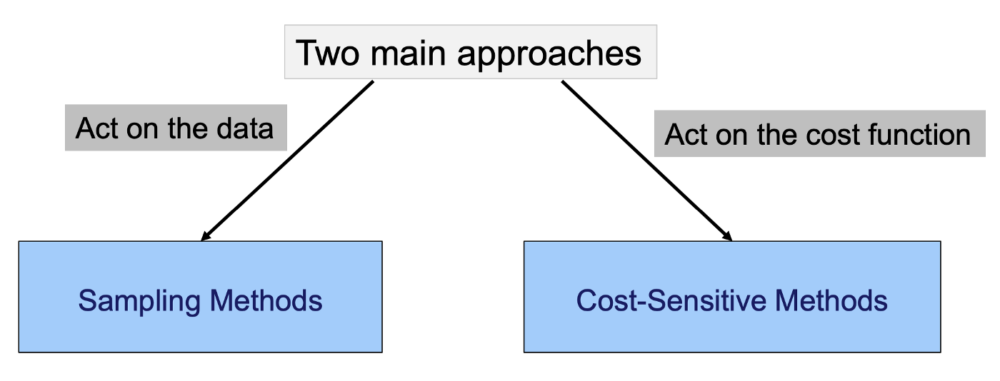

## **Weighted Loss**
#### Now that we know, imbalance data impacts model performance whether it being KNN or Logistic Regression, is there a way to handle imbalance data ?

We notice how Imbalance data causes issues on the loss function.



### **Can we manupilate the loss function such that it incooporates Imbalance data case too ?**
- Assume we have 1000 datapoints
-  We can a class-weight to the log-loss function which will be a constant
 - loss = $∑_{i=1}^{i=1000}logloss_i .w_i$

#### how to calculate this class-weight ?
- we see , we have 850 -ve class samples and 150 +ve class samples.
- Hence $w_i$ can be defined as the ratio of class with more number of samples to the class with less number of samoples $ w_i = \frac{850}{150} ≈ 6 $  

- Since +ve class has less samples, we say $w_i = 6$
- And for -ve class, we say $w_i = 1$



Note: this approach is done on the model parameters.


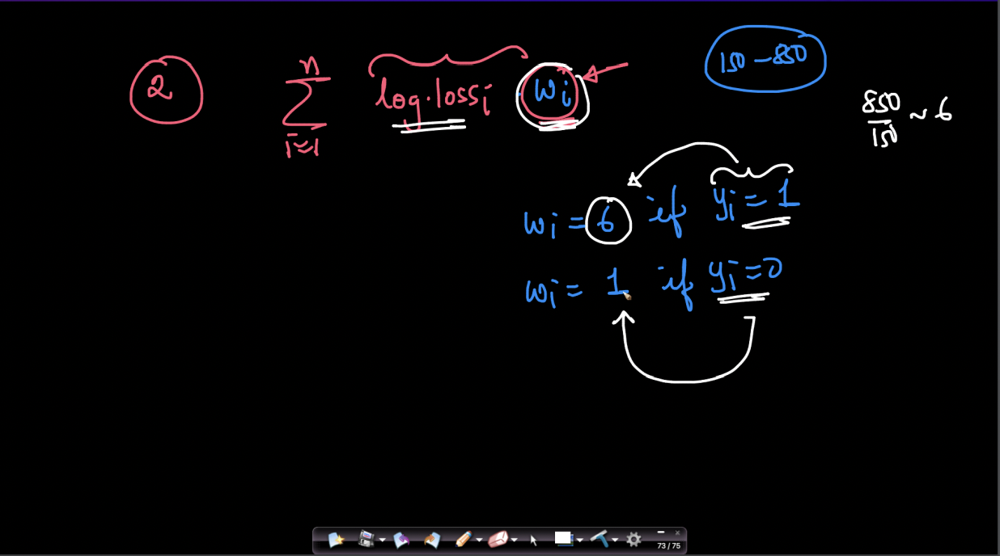

#### Implementation of Churn Prediction using weighted loss


Lets now see how its implemented in SKlearn for Logisitic Regression
- Since we cannot use Accuracy, We will be using F1-Score as metric for comparing the best Regularization Parameter (λ).

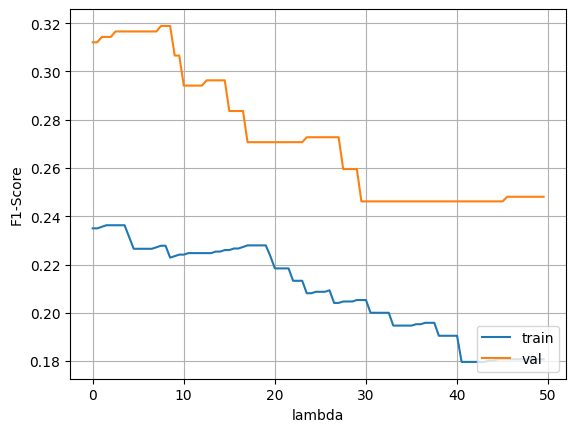

In [ ]:
# Hyper-pram tuning without any rebalancing
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.metrics import f1_score

train_scores = []
val_scores = []
scaler = StandardScaler()
l = 0.01
h = 50.0
d = 0.5

for la in np.arange(l,h,d):
  scaled_lr = make_pipeline( scaler, LogisticRegression(C=1/la))
  scaled_lr.fit(X_train, y_train)
  train_y_pred = scaled_lr.predict(X_train)
  val_y_pred = scaled_lr.predict(X_val)
  train_score = f1_score(y_train, train_y_pred)
  val_score = f1_score(y_val, val_y_pred)
  train_scores.append(train_score)
  val_scores.append(val_score)

plt.figure()
plt.plot(list(np.arange(l,h,d)), train_scores, label="train")
plt.plot(list(np.arange(l,h,d)), val_scores, label="val")
plt.legend(loc='lower right')
plt.xlabel("lambda")
plt.ylabel("F1-Score")
plt.grid()
plt.show()

In [ ]:
best_idx = np.argmax(val_scores)
print(val_scores[best_idx])

0.3188405797101449


In [ ]:
y_train.value_counts()

,count
Churn,
0,1718
1,281


**Observe**

how the model has performed poorly without the weighted log-loss
- As the best F1-Score for validation is only 31.88%

<br>

Now we are adding class weights to each of the class labels
- For Not Churn $y_i = 0$,
    - $w_0 = 1 $  
- For Churn $y_i = 1$,    
    - $w_1 = \frac{1718}{281} = 6.11 $  

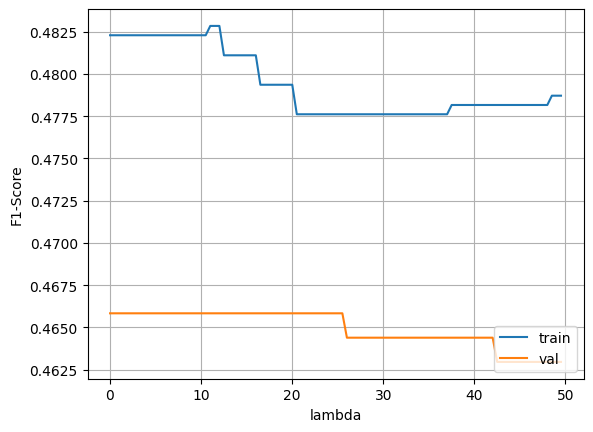

In [ ]:
# minority class needs more re-weighting

# Hyper-pram tuning
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.metrics import f1_score

train_scores = []
val_scores = []
scaler = StandardScaler()
l = 0.01
h = 50.0
d = 0.5

for la in np.arange(l,h,d):
  scaled_lr = make_pipeline( scaler, LogisticRegression(C=1/la, class_weight={ 0:1, 1:6 }))
  scaled_lr.fit(X_train, y_train)
  train_y_pred = scaled_lr.predict(X_train)
  val_y_pred = scaled_lr.predict(X_val)
  train_score = f1_score(y_train, train_y_pred)
  val_score = f1_score(y_val, val_y_pred)
  train_scores.append(train_score)
  val_scores.append(val_score)

#plotting
plt.figure()
plt.plot(list(np.arange(l,h,d)), train_scores, label="train")
plt.plot(list(np.arange(l,h,d)), val_scores, label="val")
plt.legend(loc='lower right')
plt.xlabel("lambda")
plt.ylabel("F1-Score")
plt.grid()
plt.show()

In [ ]:
best_idx = np.argmax(val_scores)
print(val_scores[best_idx])

0.4658385093167702


**Observe**

how introducing Weighted-loss,
- increased the F1-score

<br>


Using the best  Regularization parameter and the class-weight,
- we see the performance of the model on test data


In [ ]:
# Model with lambda_best
best_idx = np.argmax(val_scores)
l_best = l+d*best_idx
scaled_lr = make_pipeline( scaler, LogisticRegression(C=1/l_best, class_weight={ 0:1, 1:6 }))
scaled_lr.fit(X_train, y_train)

y_pred_test = scaled_lr.predict(X_test)
test_score = f1_score(y_test, y_pred_test)

print(test_score)

0.5098039215686274


Let's look at this confusion matrix for the data.

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report

conf_mat = confusion_matrix(y_test, scaled_lr.predict(X_test))
print(conf_mat)

[[439 127]
 [ 23  78]]


Text(0.5, 1.0, 'Confusion Matrix')

<Figure size 800x800 with 0 Axes>

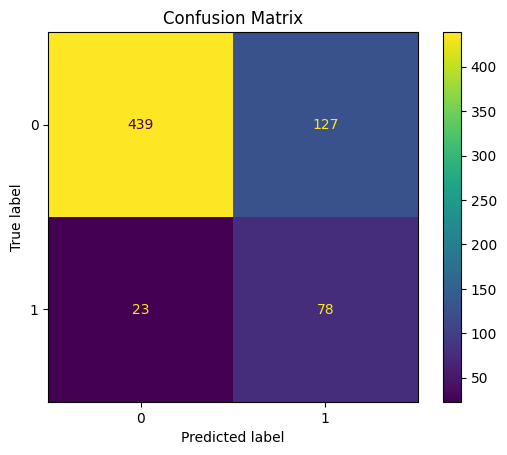

In [ ]:
#Plotting the confusion matrix
plt.figure(figsize=(8,8))
ConfusionMatrixDisplay(conf_mat).plot()
plt.title('Confusion Matrix')

- Notice, how after weighted log-loss, the model is quite good in classifying most of the data correctly

Lets look into the other metrics as well

In [ ]:
print(classification_report(y_test, scaled_lr.predict(X_test)))

              precision    recall  f1-score   support

           0       0.95      0.78      0.85       566
           1       0.38      0.77      0.51       101

    accuracy                           0.78       667
   macro avg       0.67      0.77      0.68       667
weighted avg       0.86      0.78      0.80       667



**QUIZ**

```
if we have 1000 samples, out of which 200 belongs to +ve class(Y=1) and rest to -ve class (Y=0) then what should be the class weights(W_1, W_0)?

1. w_1 = 4, w_0 = 1
2. w_1 = 1, w_0 = 4
3. w_1 = 5 , w_0 = 1.25

```
**Answer**

1. w_1 = 4, w_0 = 1

**Explanation**

Since Y = 1 is the minority class,
- hence class weight $w_1$= 800/200 = 4

As Y =0 is in majority
- Hence class weight $w_0$ = 1

**ASSESSMENT COVERED**
- https://www.scaler.com/hire/test/problem/25651/
**Coding question**
- https://www.scaler.com/hire/test/problem/25646/

# **Undersampling**

- The other approach is to remove datapoints/samples of the -ve class label (since more in number)
- such that Datapoints of -ve class label is equal to the datapoints of +ve class label.

#### But does reducing the data cause data information loss ?
- Yes, with such information loss, it reduces the model reliability

- Hence we do Undersampling, only when the number of datapoints/samples(n) are really large( apporx. 1 billion)



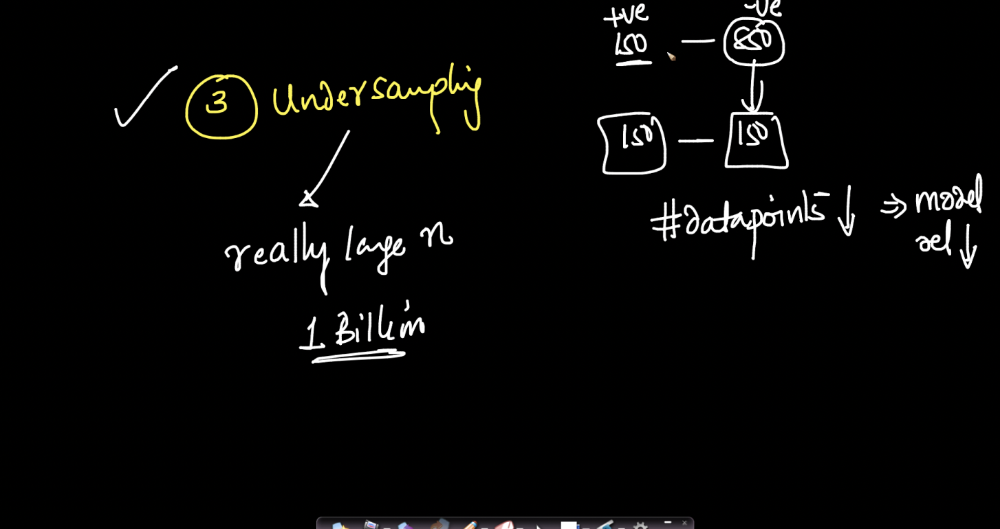

### Undersampling code

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score
from imblearn.under_sampling import RandomUnderSampler

# Create an instance of RandomOverSampler
undersampler = RandomUnderSampler()

# Perform oversampling on the training data
print('Before undersampling')
print(y_train.value_counts())
X_train_undersampled, y_train_undersampled = undersampler.fit_resample(X_train_scaled, y_train)

print('After undersampling')
print(y_train_undersampled.value_counts())

model = LogisticRegression()
model.fit(X_train_undersampled, y_train_undersampled)

train_y_pred = model.predict(X_train_undersampled)
test_y_pred = model.predict(X_test_scaled)

train_score = f1_score(y_train_undersampled, train_y_pred)
test_score = f1_score(y_test, test_y_pred)

print(f'Training F1 score:{train_score}, Testing F1 score:{test_score}')

Before undersampling
Churn
0    1718
1     281
Name: count, dtype: int64
After undersampling
Churn
0    281
1    281
Name: count, dtype: int64
Training F1 score:0.7495559502664298, Testing F1 score:0.5032679738562091


# **Oversampling**



#### Now what if we only wanted to change on the data, to make it balanced ?

- The first approach is , if we replicating the samples of the +ve labels such that it becomes almost same as the -ve labels.

- Now if we Replicate the 150 samples 6 times, we get 900 samples for +ve class label.

- This makes our total number of samples (n) as 850+900  = 1750

hence our loss function becomes
- loss = $∑_{i=1}^{i=1750}log-loss_i $


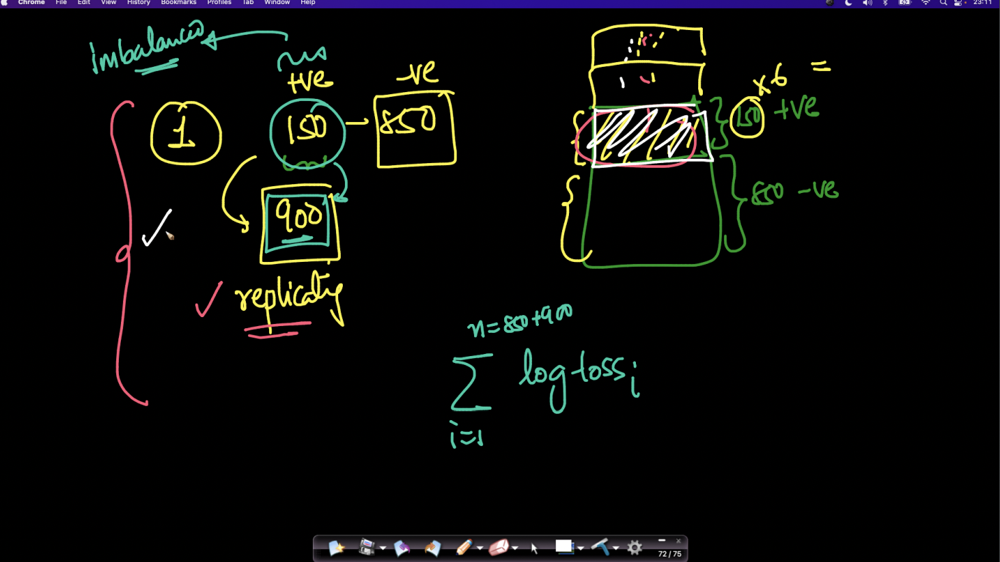

**QUIZ**

```
If data has 200 +ve class labels and 100 -ve class labels, and we do no want to lose the data information, what should we do ?
1. Perform Oversampling on +ve Class labels
2. Perform Undersampling on -ve Class labels
3. Perform Oversampling on -ve Class labels
4. Perform Undersampling on +ve Class labels

```

**ANSWER**
4. Perform Oversampling on -ve Class labels



**ASSESSMENT COVERED**
- https://www.scaler.com/hire/test/problem/25432/

### Oversampling code

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score
from imblearn.over_sampling import RandomOverSampler

# Create an instance of RandomOverSampler
oversampler = RandomOverSampler()

# Perform oversampling on the training data
print('Before Oversampling')
print(y_train.value_counts())
X_train_oversampled, y_train_oversampled = oversampler.fit_resample(X_train_scaled, y_train)

print('After Oversampling')
print(y_train_oversampled.value_counts())

model = LogisticRegression()
model.fit(X_train_oversampled, y_train_oversampled)

train_y_pred = model.predict(X_train_oversampled)
test_y_pred = model.predict(X_test_scaled)

train_score = f1_score(y_train_oversampled, train_y_pred)
test_score = f1_score(y_test, test_y_pred)

print(f'Training F1 score:{train_score}, Testing F1 score:{test_score}')

Before Oversampling
Churn
0    1718
1     281
Name: count, dtype: int64
After Oversampling
Churn
0    1718
1    1718
Name: count, dtype: int64
Training F1 score:0.7572815533980582, Testing F1 score:0.5048543689320388


# **SMOTE (Synthetically Minority Oversampling Technique)**

<center><img src="https://drive.google.com/uc?id=16IjdHQqcddwUOtbOzVYrQufofftbOReZ" width="1000" height="200"> </center>


- Notice how in oversampling data we were just repeating the data

#### Can we a bit more smart about the oversampling approach and use something like K Nearest Neighbors based approach?

Lets assume we have an imbalanced dataset having a large number of +ve labels samples and a few number of -ve labels samples
- Lets take k = 3, and we take a random point $x_1$  on the -ve class label.
    - now for i which varies from 1 to k
    - we compute the distance ($d_{1,2}$) between $x_1$ and the 1st nearest neighbor $x_2$ using the different distance metrics
    - Now we select a random value between [0,1], lets assume we select 0.2
    - with these values, we create a new datapoint $x_{new} = x_1 + 0.2 d_{1,2}$
    - Now we will add this $x_{new}$ to the dataset with class label as -ve
    - We repeat this, for the other Nearest Neighbors   


#### how is SMOTE better than oversampling ?
- In oversampling, we are simply repeating the data
- But now we are synthetically creating new data



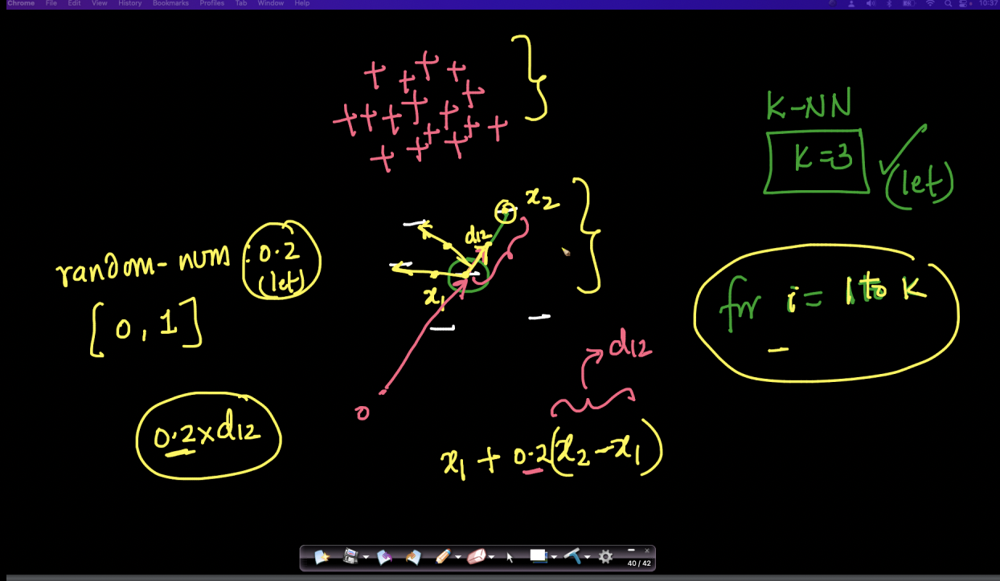

<center><img src="https://drive.google.com/uc?id=1EqJn71GczbcOsqBE4eMsGjVDxjnOhvJn" width="800" height="400"> </center>

- So in short, if we have three datapoints $x_1,x_2,x_3$ with all -ve class labels,
- SMOTE uses K nearest neighbors approach to add a new synthetic  nearest neighbor datapoint between the original datapoints.here look how,
    - SMOTE adds $x_{new}^1$ between $x_1$ and $x_2$
    - While $x_{new}^2$ between $x_3$ and $x_1$  

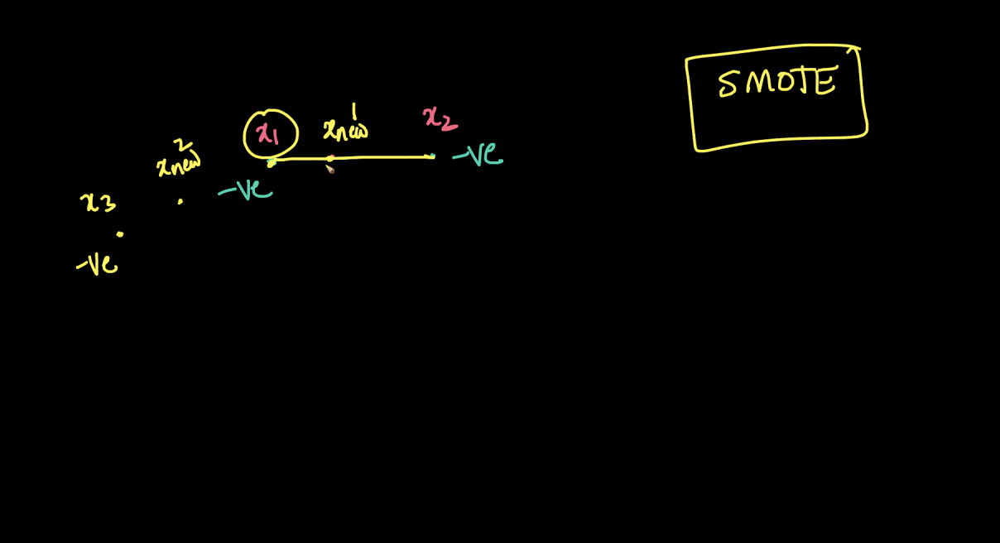

**QUIZ**

```
if k = 10, how many $x_{new}$ datapoints will be created for datapoints $x_1$ and $x_2$ ?

A. 10

B. 1

C. 3

D. 5
```

**ANSWER**

A. 10

**EXPLANATION**

For a particular datapoint $x_1$, we first loop from 1 to K, hence number of $x_new$ created per $x_1$ will be equal to 10.


**ASSESSMENT COVERED**
- https://www.scaler.com/hire/test/problem/18250/
- https://www.scaler.com/hire/test/problem/20745/
- https://www.scaler.com/hire/test/problem/17687/
- https://www.scaler.com/hire/test/problem/25650/

### Implementation of Churn Prediction using [SMOTE](https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.SMOTE.html)

In [ ]:
from imblearn.over_sampling import SMOTE
from collections import Counter

smt = SMOTE()
X_sm, y_sm = smt.fit_resample(X_train, y_train)

print('Resampled dataset shape {}'.format(Counter(y_sm)))

Resampled dataset shape Counter({0: 1718, 1: 1718})


- Notice how the data has been resampled using synthetic data, such that
 - Churn samples $y=1$ are now same as the Not Churn $y=0$ Samples



In [ ]:
X_sm.shape,y_sm.shape

((3436, 5), (3436,))

starting with the implementation of Logistic Regression




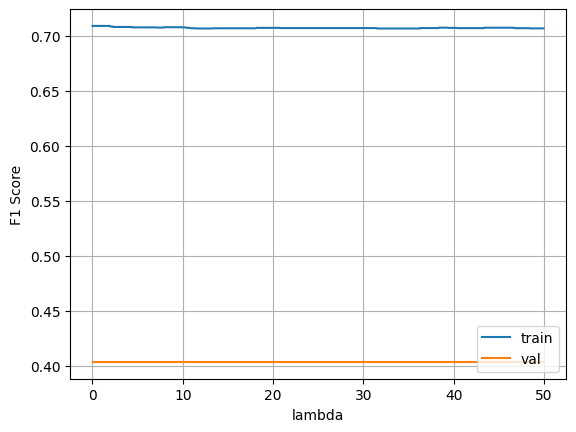

In [ ]:
# Hyper-pram tuning without any rebalancing
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline


train_scores = []
val_scores = []
scaler = StandardScaler()
l = 0.01
h = 50.0
d = 0.05

for la in np.arange(l,h,d):
  scaled_lr = make_pipeline( scaler, LogisticRegression(C=1/la))
  scaled_lr.fit(X_sm, y_sm)
  train_score = f1_score(y_sm, scaled_lr.predict(X_sm))
  val_score = f1_score(y_val, scaled_lr.predict(X_val))
  train_scores.append(train_score)
  val_scores.append(val_score)

plt.figure()
plt.plot(list(np.arange(l,h,d)), train_scores, label="train")
plt.plot(list(np.arange(l,h,d)), val_scores, label="val")
plt.legend(loc='lower right')
plt.xlabel("lambda")
plt.ylabel("F1 Score")
plt.grid()
plt.show()

- From this we now find the best Regularization Parameter for Logistic Regression

In [ ]:
best_idx = np.argmax(val_scores)
print(val_scores[best_idx])

0.4032697547683924


Using the best Logistic Model for Test data

And predicting the test accuracy

In [ ]:
# Model with lambda_best
best_idx = np.argmax(val_scores)
l_best = l+d*best_idx
scaled_lr = make_pipeline( scaler, LogisticRegression(C=1/l_best))
scaled_lr.fit(X_sm, y_sm)

y_pred_test = scaled_lr.predict(X_test)
test_score = f1_score(y_test, y_pred_test)

print(test_score)

0.45251396648044695


### Notice how Logistic Regression model F1-score is pretty bad on the test data, Why is that ?

lets have a check on the other metrics as well:

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report


conf_mat = confusion_matrix(y_test, scaled_lr.predict(X_test))
print(conf_mat)

[[390 176]
 [ 20  81]]


Text(0.5, 1.0, 'Confusion Matrix')

<Figure size 800x800 with 0 Axes>

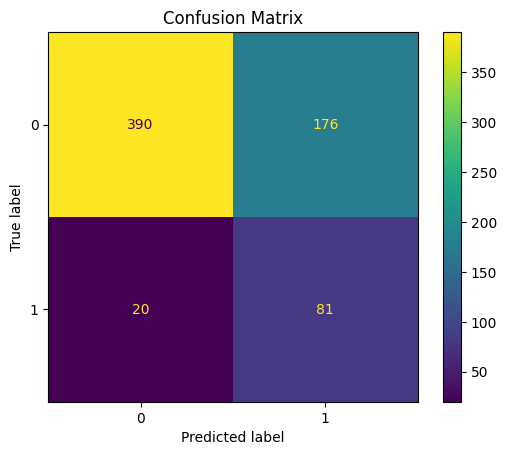

In [ ]:
#Plotting the confusion matrix
plt.figure(figsize=(8,8))
ConfusionMatrixDisplay(conf_mat).plot()
plt.title('Confusion Matrix')

**Observe**

using SMOTE
- the False Positive and False Negative increased

This means for Logisitic Regression
- Showing how Class weight works much better for Logistic Regression

In [ ]:
print(classification_report(y_test, scaled_lr.predict(X_test)))

              precision    recall  f1-score   support

           0       0.95      0.69      0.80       566
           1       0.32      0.80      0.45       101

    accuracy                           0.71       667
   macro avg       0.63      0.75      0.63       667
weighted avg       0.85      0.71      0.75       667



- Notice how all the other metrics shows the same
- That using the Weighted logloss than SMOTE makes Logistic Regression model perform much better

- Now lets look how SMOTE Oversampling works for KNN

#### KNN

Finding the best K

In [ ]:
X_sm_scaled = scaler.fit_transform(X_sm)

In [ ]:
error = []

# Calculating error for K values between 1 and 50
# Note: 51 is not included in the loop
for i in range(1, 51):
    knn = KNeighborsClassifier(n_neighbors=i,metric='euclidean')
    knn.fit(X_sm_scaled, y_sm)
    pred_i = knn.predict(X_val_scaled)
    error.append(np.mean(pred_i != y_val))

Text(0, 0.5, 'Mean Error')

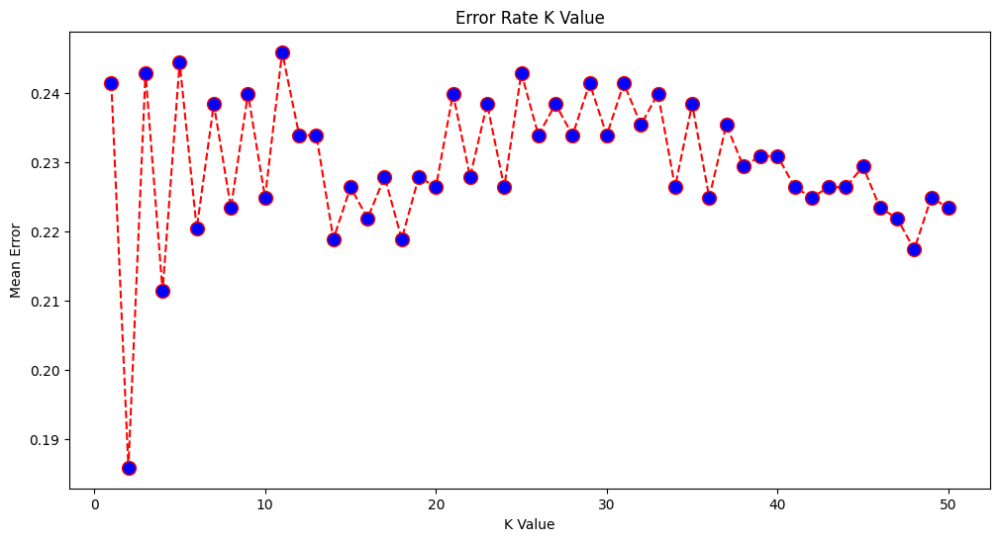

In [ ]:
plt.figure(figsize=(12, 6))
plt.plot(range(1, 51), error, color='red', linestyle='dashed', marker='o',
         markerfacecolor='blue', markersize=10)
plt.title('Error Rate K Value')
plt.xlabel('K Value')
plt.ylabel('Mean Error')

- Notice how the the best K value is when $K_{best}$=2

In [ ]:
knn = KNeighborsClassifier(n_neighbors=2,metric='euclidean')

knn.fit(X_sm_scaled, y_sm)

KNeighborsClassifier(metric='euclidean', n_neighbors=2)

Finding F1-Score of the model

In [ ]:
y_pred = knn.predict(X_test_scaled)
f1_score(y_test,y_pred)

0.5493562231759657

KNN is performing better after using SMOTE,

Lets see the Confusion Matrix on better evaluating the model

In [ ]:
cm = confusion_matrix(y_test, y_pred)

cm_df = pd.DataFrame(cm,index = np.unique(y_test), columns = np.unique(y_test) )

cm_df.head()

,0,1
0,498,68
1,37,64


Text(0.5, 1.0, 'Confusion Matrix')

<Figure size 800x800 with 0 Axes>

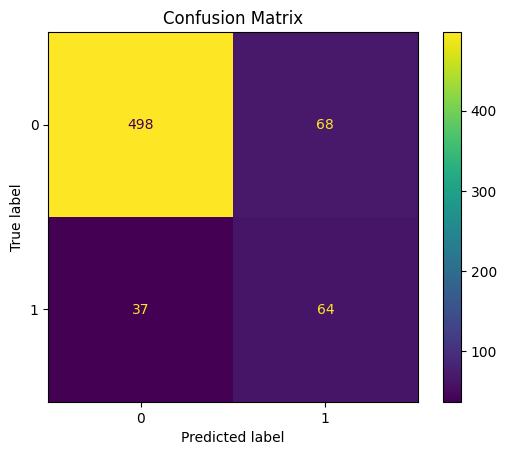

In [ ]:
#Plotting the confusion matrix
plt.figure(figsize=(8,8))
ConfusionMatrixDisplay(cm).plot()
plt.title('Confusion Matrix')

- notice how SMOTE Increased the False Negative and False Positive of KNN

In [ ]:
print(classification_report(y_test, knn.predict(X_test_scaled)))

              precision    recall  f1-score   support

           0       0.93      0.88      0.90       566
           1       0.48      0.63      0.55       101

    accuracy                           0.84       667
   macro avg       0.71      0.76      0.73       667
weighted avg       0.86      0.84      0.85       667



- This shows that using Weighted loss and different metrics we can evaluate the model much better,
- and SMOTE is not the only correct way to tackle imbalanced data